## In this notebook, we will show that (i) the Gaussian structures emerge when the model capacity is relatively small compared to the size of the training dataset and (ii) when the diffusion model is overparameterized, Gaussian structures emerge during the early training iterations before the model memorizes its training data.

In [93]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import zipfile
import PIL.Image
import json
import matplotlib.pyplot as plt
import dnnlib
import pickle
#from tqdm import tqdm
import tqdm
try:
    import pyspng
except ImportError:
    pyspng = None
import torch.nn.init as init
from knn_finder import *

### Some basic helper functions

In [94]:
def file_ext(fname):
    return os.path.splitext(fname)[1].lower()

def load_ffhq_zip(zip_path):
    zip_file = zipfile.ZipFile(zip_path)
    all_names = set(zip_file.namelist())

    PIL.Image.init()
    image_names = sorted(fname for fname in all_names if file_ext(fname) in PIL.Image.EXTENSION)

    images = []    
    # load images
    for name in tqdm.tqdm(image_names):
        with zip_file.open(name, 'r') as f:
            if pyspng is not None and file_ext(name) == '.png':
                image = pyspng.load(f.read())
            else:
                image = np.array(PIL.Image.open(f))
        if image.ndim == 2:
            image = image[:, :, np.newaxis]  # HW => HWC
        image = image.transpose(2, 0, 1)     # HWC => CHW

        # append images
        images.append(image[np.newaxis, :, :, :])

    images = np.concatenate(images, axis=0)
    N, C, H, W = images.shape
    y = torch.from_numpy(images).to(torch.float32) / 127.5 - 1
    y = y.reshape(N, C*H*W)
    return y

def load_img_zip(zip_path):
    zip_file = zipfile.ZipFile(zip_path)
    all_names = set(zip_file.namelist())

    PIL.Image.init()
    image_names = sorted(fname for fname in all_names if file_ext(fname) in PIL.Image.EXTENSION)

    images = []    
    # load images
    for name in tqdm(image_names):
        with zip_file.open(name, 'r') as f:
            if pyspng is not None and file_ext(name) == '.png':
                image = pyspng.load(f.read())
            else:
                image = np.array(PIL.Image.open(f))
        if image.ndim == 2:
            image = image[:, :, np.newaxis]  # HW => HWC
        image = image.transpose(2, 0, 1)     # HWC => CHW

        # append images
        images.append(image[np.newaxis, :, :, :])

    images = np.concatenate(images, axis=0)
    N, C, H, W = images.shape
    #y = torch.from_numpy(images).to(torch.float32) / 127.5 - 1
    y = images / 127.5 - 1
    y = y.reshape(N, -1)
    y = np.float32(y)
    return y

def normalize_img(img):
    img = img-torch.min(img)
    img = img/torch.max(img)
    return img

def torch_to_np(img):
    img = img.detach().cpu()[0].permute(1,2,0).numpy()
    return img

def normalize_img_np(img):
    img = img-np.min(img)
    img = img/np.max(img)
    return img

def get_denoised_img(noisy_img, net, var, device=torch.device('cuda')):
    # variance should be in the range(0.002,80)
    return net(noisy_img, torch.tensor(var,device=device))

def get_dataloader(data_path, batch_size):
    c = dnnlib.EasyDict()
    c.dataset_kwargs = dnnlib.EasyDict(class_name='training.dataset.ImageFolderDataset', path=data_path, use_labels=False, xflip=False, cache=True)
    c.data_loader_kwargs = dnnlib.EasyDict(pin_memory=True, num_workers=1, prefetch_factor=2)
    dataset_obj = dnnlib.util.construct_class_by_name(**c.dataset_kwargs) # subclass of training.dataset.Dataset
    dataloader = torch.utils.data.DataLoader(dataset=dataset_obj, batch_size=batch_size, shuffle=False)
    return dataset_obj

In [95]:
# Define the Gaussian model
class multi_gaussian(nn.Module):
    def __init__(self, mean, covariance,low_rank):
        super(multi_gaussian, self).__init__()
        self.mean = mean.to(torch.float64)
        self.U, self.S, self.Vh = covariance
        self.U = self.U[:,:low_rank].clone().to(torch.float64)
        self.S = self.S[:low_rank].clone().to(torch.float64)
        self.Vh = self.Vh[:low_rank,:].clone().to(torch.float64)
    def forward(self, x, sigma):
        S = self.S/(self.S + sigma**2)
        I = torch.eye(self.U.shape[0], device=self.U.device, dtype=self.U.dtype)
        x = x.flatten(start_dim = 1)
        out = torch.mm(self.Vh, (x - self.mean).t())
        out = torch.mm(torch.diag(S),out)
        return (self.mean + torch.mm(self.U, torch.mm(torch.diag(S), torch.mm(self.Vh, (x - self.mean).t()))).t())
    
# This function is used to sample images from EDM model, we use the simple first order sampler.    
def generate_image(
    net, latents ,even_t=False, num_steps=18, sigma_min=0.002, sigma_max=80, rho=7,
    S_churn=0, S_min=0, S_max=float('inf'), S_noise=1, device=torch.device('cuda')):
    sigma_list = []
    intermediates = []
    denoised_intermediates = []
    
    # Pick latents and labels.
    batch_size = latents.shape[0]
    class_labels = None
    if net.label_dim:
        class_labels = torch.eye(net.label_dim, device=device)[torch.randint(net.label_dim, size=[batch_size], device=device)]

    # Adjust noise levels based on what's supported by the network.
    sigma_min = max(sigma_min, net.sigma_min)
    sigma_max = min(sigma_max, net.sigma_max)

    # Time step discretization.
    step_indices = torch.arange(num_steps, dtype=torch.float64, device=device)
    t_steps = (sigma_max ** (1 / rho) + step_indices / (num_steps - 1) * (sigma_min ** (1 / rho) - sigma_max ** (1 / rho))) ** rho
    if even_t == True:
        t_steps = torch.from_numpy(np.linspace(sigma_max, sigma_min, num_steps)).to(device)
    t_steps = torch.cat([net.round_sigma(t_steps), torch.zeros_like(t_steps[:1])]) # t_N = 0

    # Main sampling loop.
    x_next = latents.to(torch.float64) * t_steps[0]
    for i, (t_cur, t_next) in tqdm.tqdm(list(enumerate(zip(t_steps[:-1], t_steps[1:]))), unit='step'): # 0, ..., N-1
        x_cur = x_next

        # Increase noise temporarily.
        gamma = min(S_churn / num_steps, np.sqrt(2) - 1) if S_min <= t_cur <= S_max else 0
        t_hat = net.round_sigma(t_cur + gamma * t_cur)
        x_hat = x_cur + (t_hat ** 2 - t_cur ** 2).sqrt() * S_noise * torch.randn_like(x_cur)

        # Euler step.
        denoised = net(x_hat, t_hat, class_labels).to(torch.float64)
        d_cur = (x_hat - denoised) / t_hat
        x_next = x_hat + (t_next - t_hat) * d_cur
        '''
        # Apply 2nd order correction.
        if i < num_steps - 1:
            denoised = net(x_next, t_next, class_labels).to(torch.float64)
            d_prime = (x_next - denoised) / t_next
            x_next = x_hat + (t_next - t_hat) * (0.5 * d_cur + 0.5 * d_prime)
        '''
        intermediates.append(x_cur.detach().cpu())
        denoised_intermediates.append(denoised.detach().cpu())
        sigma_list.append(t_cur.item())
        
    # Save image grid.
    return sigma_list, intermediates, denoised_intermediates

# This function is used to sample images from Gaussian model, we use the simple first order sampler.    
def generate_image_Gaussian(
    net, Gaussian_net, latents ,even_t=False, num_steps=18, sigma_min=0.002, sigma_max=80, rho=7,
    S_churn=0, S_min=0, S_max=float('inf'), S_noise=1, device=torch.device('cuda')):
    sigma_list = []
    intermediates = []
    denoised_intermediates = []
    
    # Pick latents and labels.
    batch_size = latents.shape[0]
    class_labels = None
    if net.label_dim:
        class_labels = torch.eye(net.label_dim, device=device)[torch.randint(net.label_dim, size=[batch_size], device=device)]

    # Adjust noise levels based on what's supported by the network.
    sigma_min = max(sigma_min, net.sigma_min)
    sigma_max = min(sigma_max, net.sigma_max)

    # Time step discretization.
    step_indices = torch.arange(num_steps, dtype=torch.float64, device=device)
    t_steps = (sigma_max ** (1 / rho) + step_indices / (num_steps - 1) * (sigma_min ** (1 / rho) - sigma_max ** (1 / rho))) ** rho
    if even_t == True:
        t_steps = torch.from_numpy(np.linspace(sigma_max, sigma_min, num_steps)).to(device)
    t_steps = torch.cat([net.round_sigma(t_steps), torch.zeros_like(t_steps[:1])]) # t_N = 0

    # Main sampling loop.
    x_next = latents.to(torch.float64) * t_steps[0]
    for i, (t_cur, t_next) in tqdm.tqdm(list(enumerate(zip(t_steps[:-1], t_steps[1:]))), unit='step'): # 0, ..., N-1
        x_cur = x_next

        # Increase noise temporarily.
        gamma = min(S_churn / num_steps, np.sqrt(2) - 1) if S_min <= t_cur <= S_max else 0
        t_hat = net.round_sigma(t_cur + gamma * t_cur)
        x_hat = x_cur + (t_hat ** 2 - t_cur ** 2).sqrt() * S_noise * torch.randn_like(x_cur)

        # Euler step.
        denoised = Gaussian_net(x_hat, t_hat).to(torch.float64)
        d_cur = (x_hat - denoised) / t_hat
        x_next = x_hat + (t_next - t_hat) * d_cur
        '''
        # Apply 2nd order correction.
        if i < num_steps - 1:
            denoised = net(x_next, t_next, class_labels).to(torch.float64)
            d_prime = (x_next - denoised) / t_next
            x_next = x_hat + (t_next - t_hat) * (0.5 * d_cur + 0.5 * d_prime)
        '''
        intermediates.append(x_cur.detach().cpu())
        denoised_intermediates.append(denoised.detach().cpu())
        sigma_list.append(t_cur.item())
        
    # Save image grid.
    return sigma_list, intermediates, denoised_intermediates

### Prepare dataset

In [96]:
torch.manual_seed(0)
device = torch.device('cuda')

data_path_1 = 'datasets/ffhq-64x64.zip'
data_path_2 = 'datasets/celeb_hq_64x64.zip'
data_path_3 = 'datasets/cifar10-32x32.zip'
data_path_4 = 'datasets/cifar10-32x32-test.zip'

dataset_ffhq = load_ffhq_zip(data_path_1)
dataset_celeb = load_ffhq_zip(data_path_2)
dataset_cifar_train = load_ffhq_zip(data_path_3)
dataset_cifar_test = load_ffhq_zip(data_path_4)
# # prepare test image and the noise
# device = torch.device('cuda')
# data_path_1 = 'datasets/ffhq-64x64.zip'
# data_path_2 = 'datasets/celeb_hq_64x64.zip'
# data_path_3 = 'datasets/cifar10-32x32.zip'
# dataset_ffhq = load_ffhq_zip(data_path_1)
# dataset_celeb = load_ffhq_zip(data_path_2)
# dataset_cifar = load_ffhq_zip(data_path_3)

100%|██████████| 10000/10000 [00:00<00:00, 26139.75it/s]


### 1. First, we study the effects of training dataset size.

In [100]:
# Construct the Gaussian model
imgs = dataset_ffhq
mean = torch.mean(dataset_ffhq, dim=0)
temp = imgs-mean
covariance = temp.T@temp/temp.shape[0]
covariance = covariance.to(device)
U,S,Vh = torch.linalg.svd(covariance, full_matrices=False)
U = U.to(device)
S = S.to(device)
Vh = Vh.to(device)
mean = mean.to(device)


# You can save those data for later use, compute the covariance from scratch every time can be very expensive.
'''
save_dir = 'Covariance_Cifar/50000/'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
torch.save(mean, os.path.join(save_dir,'mean.pt'))
torch.save((U,S,Vh), os.path.join(save_dir,'covariance.pt'))
'''

Gaussian_model = multi_gaussian(mean, (U, S, Vh),3*64*64).to(device)

In [104]:
net_pkl_70000 = 'Varying_dataset_size/FFHQ/70000_scale_128/edm-ffhq-64x64-uncond-ve.pkl'
net_pkl_35000 = 'Varying_dataset_size/FFHQ/35000_scale_128/network-snapshot-070246.pkl'
net_pkl_8750 = 'Varying_dataset_size/FFHQ/8750_scale_128/network-snapshot-070246.pkl'
net_pkl_1094 = 'Varying_dataset_size/FFHQ/1094_scale_128/network-snapshot-070246.pkl'
net_pkl_137 = 'Varying_dataset_size/FFHQ/137_scale_128/network-snapshot-070246.pkl'
net_pkl_68 = 'Varying_dataset_size/FFHQ/68_scale_128/network-snapshot-070246.pkl'
network_list = [net_pkl_68, net_pkl_137, net_pkl_1094, net_pkl_8750, net_pkl_35000, net_pkl_70000]
#network_list = [net_pkl_68, net_pkl_1094, net_pkl_35000, net_pkl_70000]

### Below, we visualize the generations of Diffusion models with fixed model scale (128) trained on datasets of varying sizes including [68, 1094, 35000, 70000]. Notice that the generations of diffusion models trained on large datasets exhibit similar structures as the generations of the Gaussian model. Here we only show the generations of Gaussian models constructed from dataset of 70000 images while in Figure 6 of the paper we show the generations of Gaussian models constructed from each dataset size respectively.

In [105]:
torch.manual_seed(1)

# # Construct the class for finding nearest neighbors
nn_finder = KnnFinder(data_path_1)


# Construct initial noise
latents = torch.randn(20,3,64,64).to(device)
num_steps = 10

# Generate images with EDM models and finding the corresponding nearest neighbors
generations = []
nearest_neighbors = []

for i in range(len(network_list)):
    # Construct Diffusion models
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)     
    sigma_list, intermediates_edm, denoised_intermediates_edm = generate_image(net, latents ,num_steps=num_steps, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)
    generations.append(denoised_intermediates_edm[-1])

    # Find the nearest neighbors of the generated images
    temp = torch.stack(denoised_intermediates_edm)[-1].cuda()
    descending_index, _ = nn_finder(temp, sigma=torch.tensor(1).to(device)) # sigma here is a dummy variable, any positive input should work
    nn = dataset_ffhq[descending_index[:,0],:]    
    nearest_neighbors.append(nn)
    
# Generate images with the Gaussian diffusion mdoel. Here we only construct Gaussian model from dataset with size 70000 (full FFHQ dataset) but in the paper we construct the Gaussian models from datasets of varying sizes.
sigma_list, intermediates_Gaussian, denoised_intermediates_Gaussian = generate_image_Gaussian(net, Gaussian_model, latents.reshape(-1,3*64*64) ,num_steps=10, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)

load ffhq


100%|██████████| 10/10 [00:01<00:00,  7.32step/s]


idx: 0


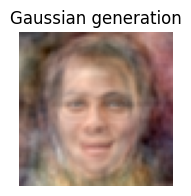

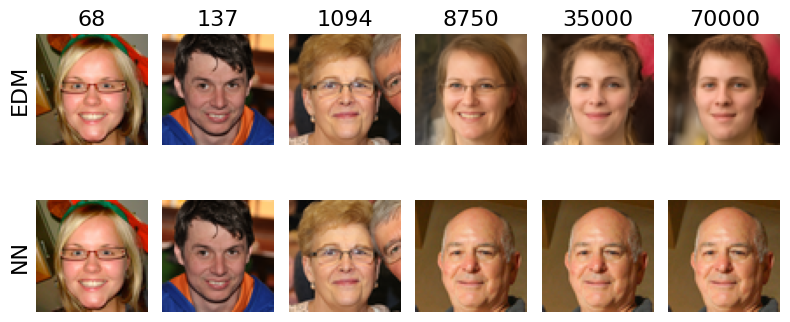

idx: 1


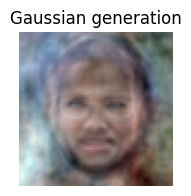

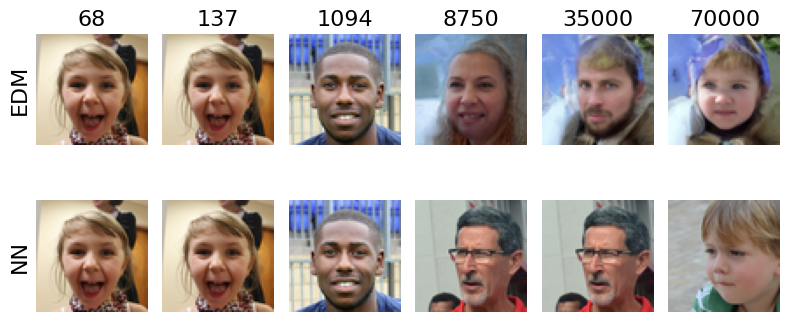

idx: 2


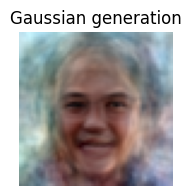

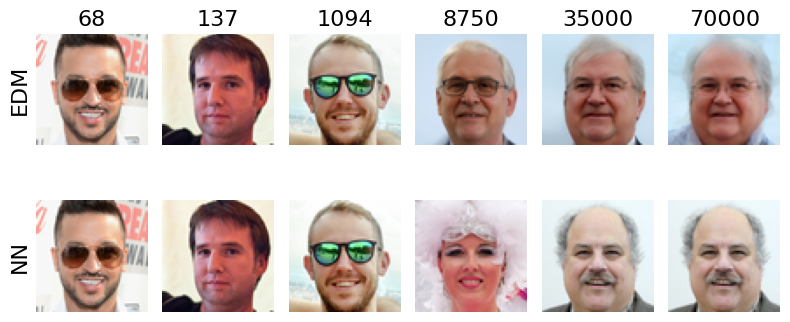

idx: 3


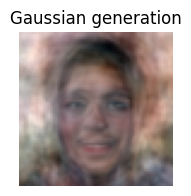

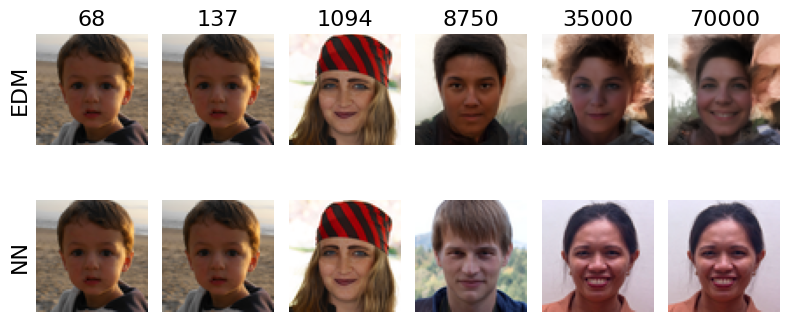

idx: 4


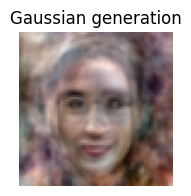

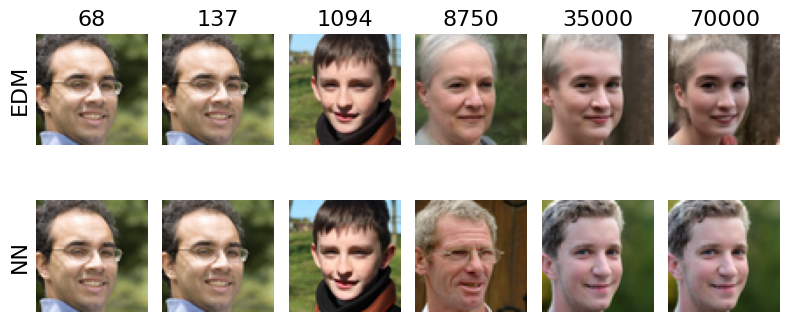

In [106]:
# Now, we are ready to visualize the generations
dataset_sizes = [68, 137, 1094, 8750, 35000, 70000]
num_show = 5 # Increase this to see more visualizations
for idx in range(num_show):
    print('idx:',idx)
    
    plt.figure(figsize=(2,2))
    plt.title('Gaussian generation')
    plt.imshow(normalize_img(denoised_intermediates_Gaussian[-4][idx].reshape(3,64,64).cpu().permute(1,2,0)))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
    plt.figure(figsize=(8,4))
    for i in range(len(dataset_sizes)):
        plt.subplot(2,6,i+1)
        plt.imshow(normalize_img(generations[i][idx].reshape(3,64,64).cpu().permute(1,2,0)))
        plt.title(str(dataset_sizes[i]), fontsize=16)
        if i==0:
            plt.ylabel('EDM', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    for i in range(len(dataset_sizes)):
        plt.subplot(2,6,i+1+6)
        plt.imshow(normalize_img(nearest_neighbors[i][idx].reshape(3,64,64).cpu().permute(1,2,0)))
        #plt.title(str(image_sizes[i]))
        if i==0:
            plt.ylabel('NN', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    plt.tight_layout()
    plt.show()

### Next, we focus on Sigma=4, where the EDM denoiser is highly nonlinear and significantly differs from the linear Gaussian model, as shown in Figure 2 of the paper. Despite their differences, we will show that the EDM denoiser at this noise level still share certain degree of similarity with the linear Gaussian denoisers as they generate similar denoising outputs whether they take noisy images or pure noise as inputs.

In [107]:
torch.manual_seed(1)
num_img = 20
sigma = 4.066123602953759
rank = 1*3*64*64

denoised_img_list_pure_noise = []
denoised_img_list_noisy_image = []

noise = torch.randn((num_img,3,64,64), device=device)
img_celeb = dataset_celeb[0:num_img].reshape(-1,3,64,64).to(device)
noisy_img = img_celeb + sigma*noise

# denoising with Gaussian model
denoised_img_noise_pred_Gaussian = Gaussian_model((sigma*noise).reshape(num_img,1,-1), sigma).reshape(num_img,3,64,64)
denoised_img_noisy_image_pred_Gaussian = Gaussian_model((noisy_img).reshape(num_img,1,-1), sigma).reshape(num_img,3,64,64)

# denoising with EDM model
network_list = [net_pkl_68, net_pkl_1094, net_pkl_35000, net_pkl_70000]

for i in range(len(network_list)):
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)
        denoised_img_pure_noise_edm = get_denoised_img(sigma*noise, net, sigma, device=device)
        denoised_img_noisy_image_edm = get_denoised_img(noisy_img, net, sigma, device=device)
        denoised_img_list_pure_noise.append(denoised_img_pure_noise_edm)
        denoised_img_list_noisy_image.append(denoised_img_noisy_image_edm)

img: 0


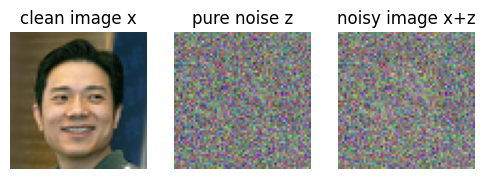

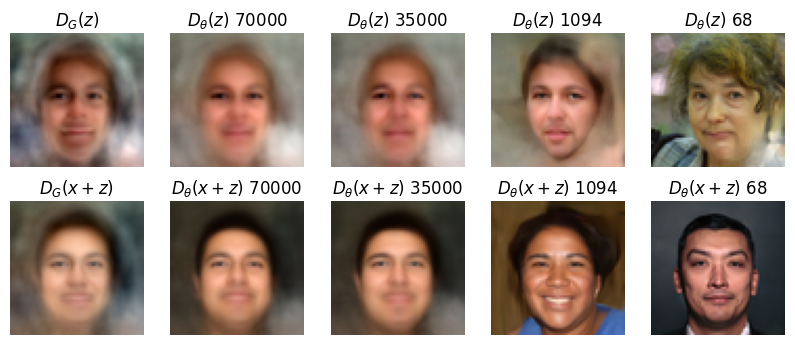

img: 1


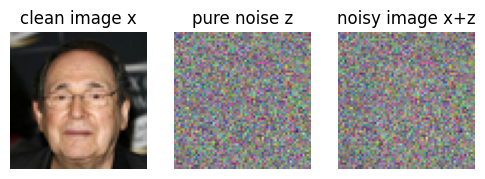

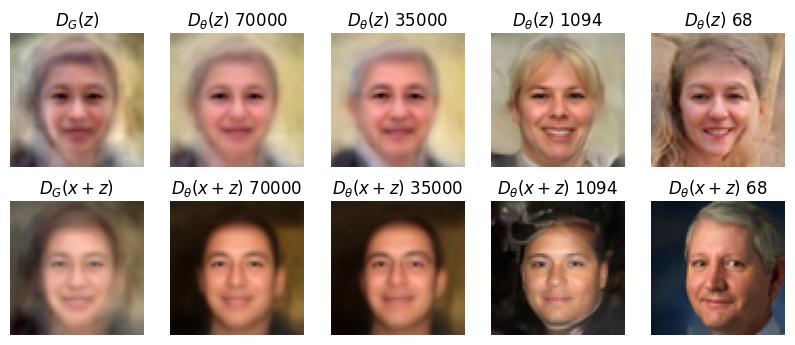

img: 2


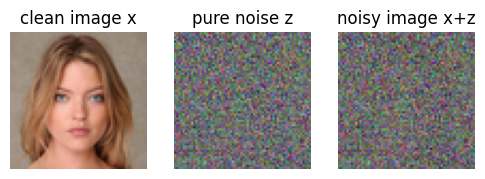

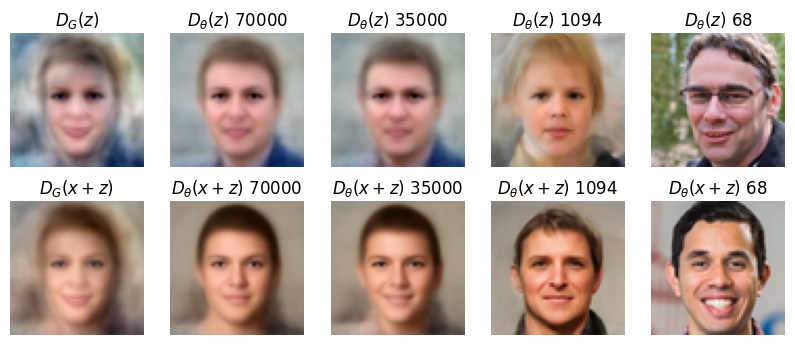

img: 3


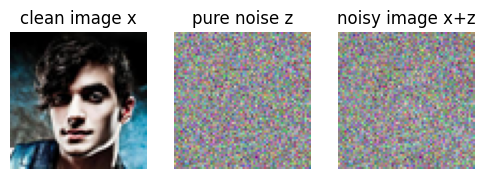

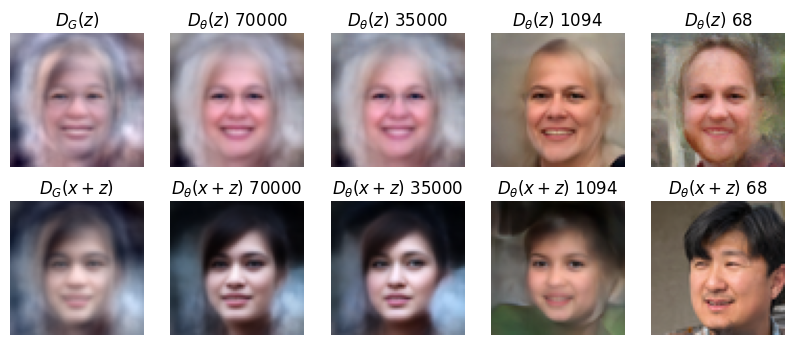

img: 4


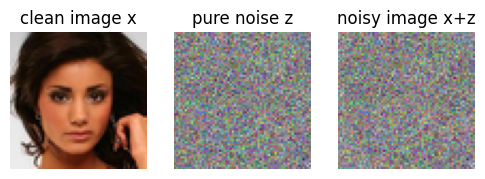

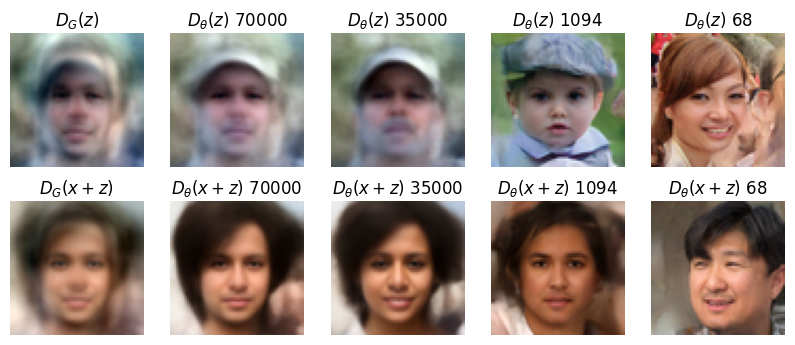

In [108]:
num_show = 5
image_sizes = [70000, 35000, 1094, 68]
for i in range(num_show):
    print('img: '+str(i))
    plt.figure(figsize=(6,2))
    plt.subplot(131)
    plt.title('clean image x')
    plt.imshow(normalize_img(img_celeb[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(132)
    plt.title('pure noise z')
    plt.imshow(normalize_img(noise[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(133)
    plt.title('noisy image x+z')
    plt.imshow(normalize_img(noisy_img[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
        
    #################################################################################
    plt.figure(figsize=(10,4))
        
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1)
    plt.title(r'$D_{G}(z)$')
    plt.imshow(normalize_img(denoised_img_noise_pred_Gaussian[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_pure_noise)):
        denoised_img = denoised_img_list_pure_noise[len(denoised_img_list_pure_noise)-j-1]
        plt.subplot(2,1+len(denoised_img_list_pure_noise),1+j+1)
        plt.title(r'$D_{\theta}(z)$ '+ str(image_sizes[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.show()
    #################################################################################
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1+1*(1+len(denoised_img_list_noisy_image)))
    plt.title(r'$D_{G}(x+z)$')
    plt.imshow(normalize_img(denoised_img_noisy_image_pred_Gaussian[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_noisy_image)):
        denoised_img = denoised_img_list_noisy_image[len(denoised_img_list_noisy_image)-j-1]
        plt.subplot(2,1+len(denoised_img_list_noisy_image),1+j+1+1*(1+len(denoised_img_list_noisy_image)))
        plt.title(r'$D_{\theta}(x+z)$ '+ str(image_sizes[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.tight_layout()

    plt.show()

### The above results demonstrate that the diffusion denoisers are close the the Gaussian denoisers when the dataset size is large enough. When the dataset size is small, diffusion models memorize the training data, which are directly retrieved as denoising outputs.

### 3. Next, we sudy the effects of model capacity. We fix the dataset size as 1094 and train diffusion models of different capacities with scale [4, 8, 16, 32, 64, 128] (cbase parameter in the EDM model). 

In [111]:
net_1094_4 = 'Varying_model_scale/FFHQ/1094_scale_4/network-snapshot-197843.pkl'
net_1094_8 = 'Varying_model_scale/FFHQ/1094_scale_8/network-snapshot-197843.pkl'
net_1094_16 = 'Varying_model_scale/FFHQ/1094_scale_16/network-snapshot-070246.pkl'
net_1094_32 = 'Varying_model_scale/FFHQ/1094_scale_32/network-snapshot-070246.pkl'
net_1094_64 = 'Varying_model_scale/FFHQ/1094_scale_64/network-snapshot-070246.pkl'
net_1094_128 = 'Varying_model_scale/FFHQ/1094_scale_128/network-snapshot-070246.pkl'
network_list = [net_1094_128, net_1094_64, net_1094_32, net_1094_16, net_1094_8, net_1094_4]
#network_list = [net_1094_128, net_1094_64,  net_1094_8, net_1094_4]

### We first visualize the generated samples of these models. As we will see, when dataset size is small, large model memorizes the training data while small model learns the Gaussian structure.

In [112]:
torch.manual_seed(1)

# # Construct the class for finding nearest neighbors
nn_finder = KnnFinder(data_path_1)


# Construct initial noise
latents = torch.randn(20,3,64,64).to(device)
num_steps = 10

# Generate images with EDM models and finding the corresponding nearest neighbors
generations = []
nearest_neighbors = []

for i in range(len(network_list)):
    # Construct Diffusion models
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)     
    sigma_list, intermediates_edm, denoised_intermediates_edm = generate_image(net, latents ,num_steps=num_steps, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)
    generations.append(denoised_intermediates_edm[-1])

    # Find the nearest neighbors of the generated images
    temp = torch.stack(denoised_intermediates_edm)[-1].cuda()
    descending_index, _ = nn_finder(temp, sigma=torch.tensor(1).to(device)) # sigma here is a dummy variable, any positive input should work
    nn = dataset_ffhq[descending_index[:,0],:]    
    nearest_neighbors.append(nn)
    
# Generate images with the Gaussian diffusion mdoel. Here we only construct Gaussian model from dataset with size 70000 (full FFHQ dataset) but in the paper we construct the Gaussian models from datasets of varying sizes.
sigma_list, intermediates_Gaussian, denoised_intermediates_Gaussian = generate_image_Gaussian(net, Gaussian_model, latents.reshape(-1,3*64*64) ,num_steps=10, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)

load ffhq


100%|██████████| 10/10 [00:01<00:00,  7.35step/s]


idx: 0


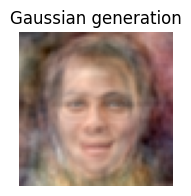

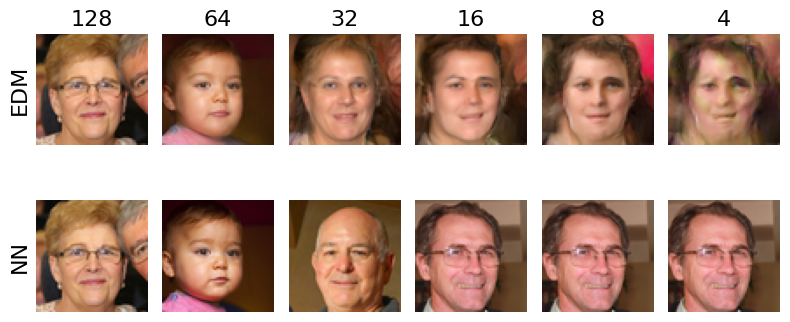

idx: 1


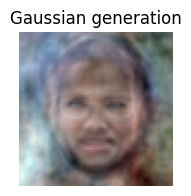

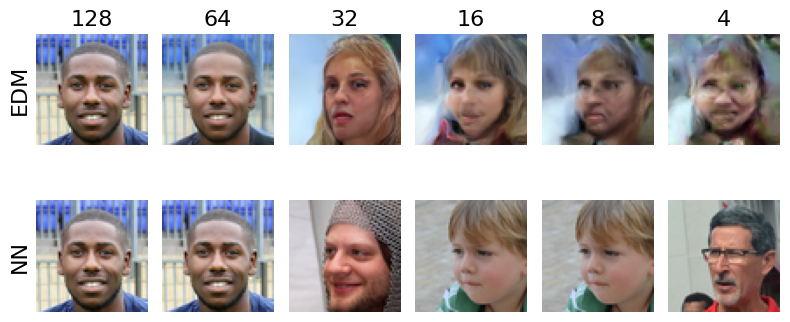

idx: 2


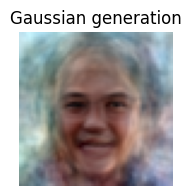

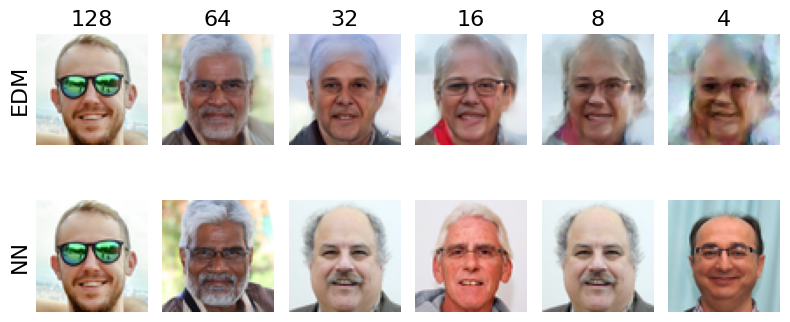

idx: 3


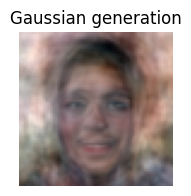

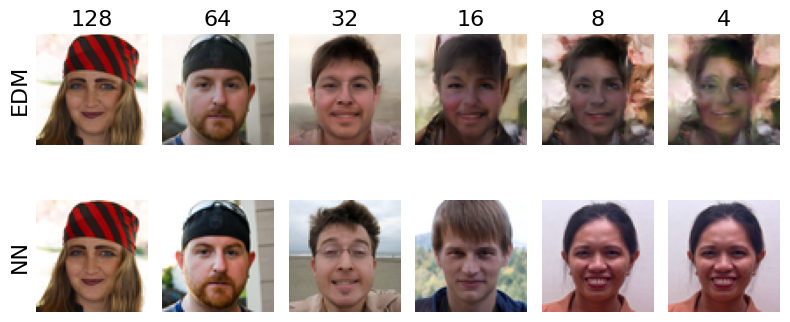

idx: 4


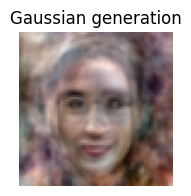

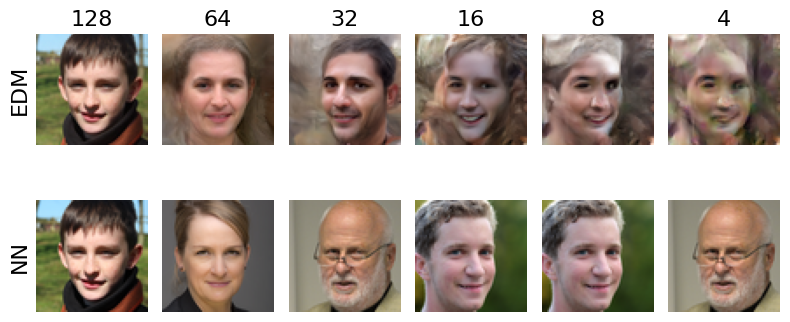

In [113]:
# Now, we are ready to visualize the generations
model_scales = [128, 64, 32, 16, 8, 4]
num_show = 5 # increase this to see more images
for idx in range(num_show):
    print('idx:',idx)
    
    plt.figure(figsize=(2,2))
    plt.title('Gaussian generation')
    plt.imshow(normalize_img(denoised_intermediates_Gaussian[-4][idx].reshape(3,64,64).cpu().permute(1,2,0)))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
    plt.figure(figsize=(8,4))
    for i in range(len(model_scales)):
        plt.subplot(2,6,i+1)
        plt.imshow(normalize_img(generations[i][idx].reshape(3,64,64).cpu().permute(1,2,0)))
        plt.title(str(model_scales[i]), fontsize=16)
        if i==0:
            plt.ylabel('EDM', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    for i in range(len(model_scales)):
        plt.subplot(2,6,i+1+6)
        plt.imshow(normalize_img(nearest_neighbors[i][idx].reshape(3,64,64).cpu().permute(1,2,0)))
        #plt.title(str(image_sizes[i]))
        if i==0:
            plt.ylabel('NN', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    plt.tight_layout()
    plt.show()

### Next, we focus on Sigma=4, where the EDM denoiser is highly nonlinear and significantly differs from the linear Gaussian model. Despite their differences, we will show that the EDM denoiser at this noise level still share certain degree of similarity with the linear Gaussian denoisers as they generate similar denoising outputs whether they take noisy images or pure noise as inputs.

In [114]:
torch.manual_seed(1)
num_img = 20
sigma = 4.066123602953759
rank = 1*3*64*64

denoised_img_list_pure_noise = []
denoised_img_list_noisy_image = []

noise = torch.randn((num_img,3,64,64), device=device)
img_celeb = dataset_celeb[0:num_img].reshape(-1,3,64,64).to(device)
noisy_img = img_celeb + sigma*noise

# denoising with Gaussian model
denoised_img_noise_pred_Gaussian = Gaussian_model((sigma*noise).reshape(num_img,1,-1), sigma).reshape(num_img,3,64,64)
denoised_img_noisy_image_pred_Gaussian = Gaussian_model((noisy_img).reshape(num_img,1,-1), sigma).reshape(num_img,3,64,64)

# denoising with EDM model
network_list = [net_1094_128, net_1094_64,  net_1094_8, net_1094_4]

for i in range(len(network_list)):
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)
        denoised_img_pure_noise_edm = get_denoised_img(sigma*noise, net, sigma, device=device)
        denoised_img_noisy_image_edm = get_denoised_img(noisy_img, net, sigma, device=device)
        denoised_img_list_pure_noise.append(denoised_img_pure_noise_edm)
        denoised_img_list_noisy_image.append(denoised_img_noisy_image_edm)

img: 0


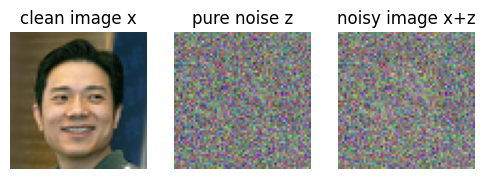

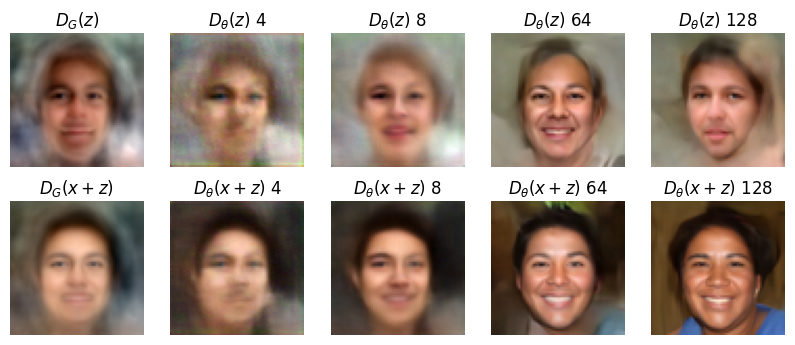

img: 1


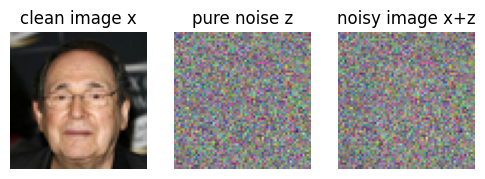

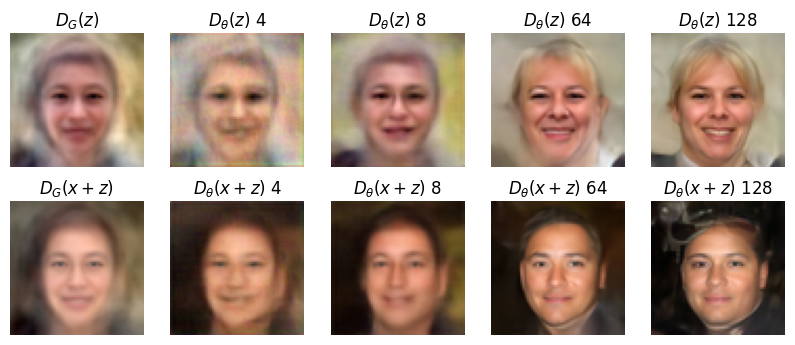

img: 2


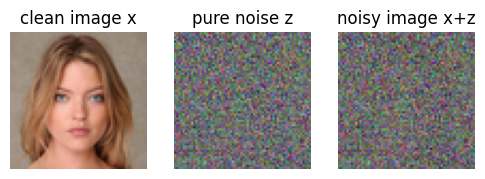

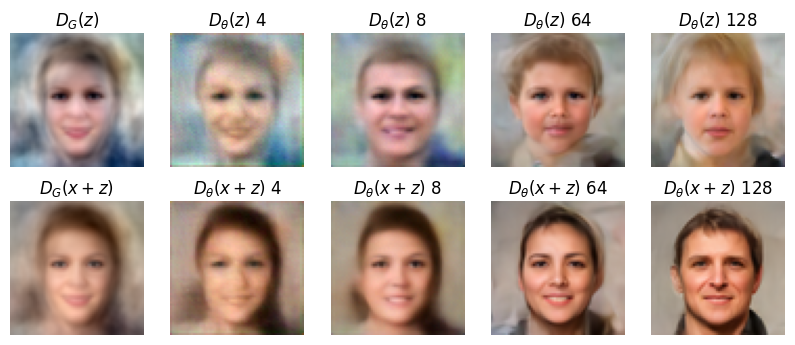

img: 3


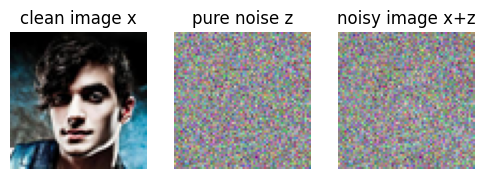

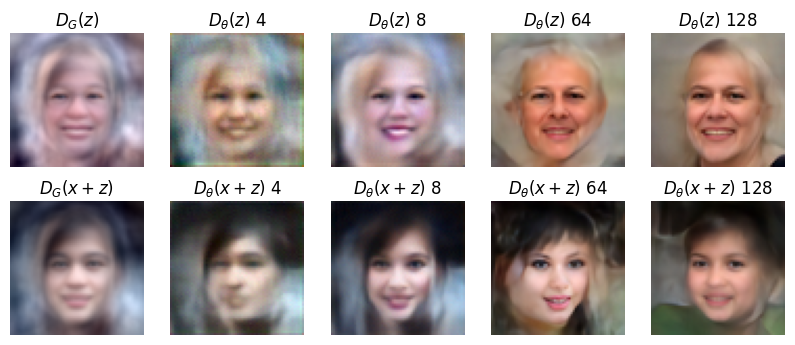

img: 4


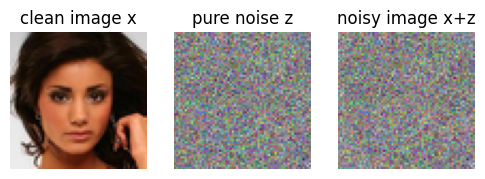

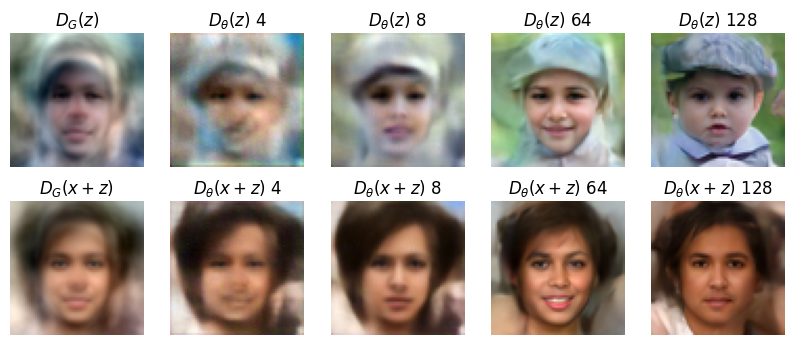

In [115]:
model_scales = [4, 8, 64, 128]
num_show = 5
for i in range(num_show):
    print('img: '+str(i))
    plt.figure(figsize=(6,2))
    plt.subplot(131)
    plt.title('clean image x')
    plt.imshow(normalize_img(img_celeb[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(132)
    plt.title('pure noise z')
    plt.imshow(normalize_img(noise[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(133)
    plt.title('noisy image x+z')
    plt.imshow(normalize_img(noisy_img[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
        
    #################################################################################
    plt.figure(figsize=(10,4))
        
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1)
    plt.title(r'$D_{G}(z)$')
    plt.imshow(normalize_img(denoised_img_noise_pred_Gaussian[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_pure_noise)):
        denoised_img = denoised_img_list_pure_noise[len(denoised_img_list_pure_noise)-j-1]
        plt.subplot(2,1+len(denoised_img_list_pure_noise),1+j+1)
        plt.title(r'$D_{\theta}(z)$ '+ str(model_scales[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.show()
    #################################################################################
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1+1*(1+len(denoised_img_list_noisy_image)))
    plt.title(r'$D_{G}(x+z)$')
    plt.imshow(normalize_img(denoised_img_noisy_image_pred_Gaussian[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_noisy_image)):
        denoised_img = denoised_img_list_noisy_image[len(denoised_img_list_noisy_image)-j-1]
        plt.subplot(2,1+len(denoised_img_list_noisy_image),1+j+1+1*(1+len(denoised_img_list_noisy_image)))
        plt.title(r'$D_{\theta}(x+z)$ '+ str(model_scales[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.tight_layout()

    plt.show()

### The above results demonstrate that the diffusion denoisers are close the the Gaussian denoisers when the model capacity is relatively small compared to the training dataset size.

### 4. When the training dataset size is small, such as 1094, a large enough deep networks with scale 128 is capable of memorizing the training data after sufficient training. Nevertheless, as we will show next, during the early training epochs, the diffusion models still learn the Gaussian structure. The network snapshot is saved everytime the model has been trained on 1k images. For example, 205 stands for the model has 'seen' 205k images. Since the small dataset contains 1.094k images, the current epoch is roughly 205k/1.094k = 187.

In [116]:
net_1094_205 = 'Varying_training_epochs/FFHQ/1094/network-snapshot-000205.pkl'
net_1094_921 = 'Varying_training_epochs/FFHQ/1094/network-snapshot-000921.pkl'
net_1094_2509 = 'Varying_training_epochs/FFHQ/1094/network-snapshot-002509.pkl'
net_1094_10035 = 'Varying_training_epochs/FFHQ/1094/network-snapshot-010035.pkl'
net_1094_35123 = 'Varying_training_epochs/FFHQ/1094/network-snapshot-035123.pkl'
net_1094_70246 = 'Varying_training_epochs/FFHQ/1094/network-snapshot-070246.pkl'
network_list = [net_1094_205, net_1094_921, net_1094_2509, net_1094_10035, net_1094_35123, net_1094_70246]

In [117]:
torch.manual_seed(1)

# # Construct the class for finding nearest neighbors
nn_finder = KnnFinder(data_path_1)


# Construct initial noise
latents = torch.randn(20,3,64,64).to(device)
num_steps = 10

# Generate images with EDM models and finding the corresponding nearest neighbors
generations = []
nearest_neighbors = []

for i in range(len(network_list)):
    # Construct Diffusion models
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)     
    sigma_list, intermediates_edm, denoised_intermediates_edm = generate_image(net, latents ,num_steps=num_steps, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)
    generations.append(denoised_intermediates_edm[-1])

    # Find the nearest neighbors of the generated images
    temp = torch.stack(denoised_intermediates_edm)[-1].cuda()
    descending_index, _ = nn_finder(temp, sigma=torch.tensor(1).to(device)) # sigma here is a dummy variable, any positive input should work
    nn = dataset_ffhq[descending_index[:,0],:]    
    nearest_neighbors.append(nn)
    
# Generate images with the Gaussian diffusion mdoel. Here we only construct Gaussian model from dataset with size 70000 (full FFHQ dataset) but in the paper we construct the Gaussian models from datasets of varying sizes.
sigma_list, intermediates_Gaussian, denoised_intermediates_Gaussian = generate_image_Gaussian(net, Gaussian_model, latents.reshape(-1,3*64*64) ,num_steps=10, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)

load ffhq


100%|██████████| 10/10 [00:01<00:00,  7.34step/s]


idx: 0


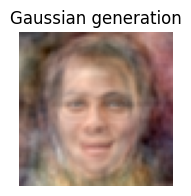

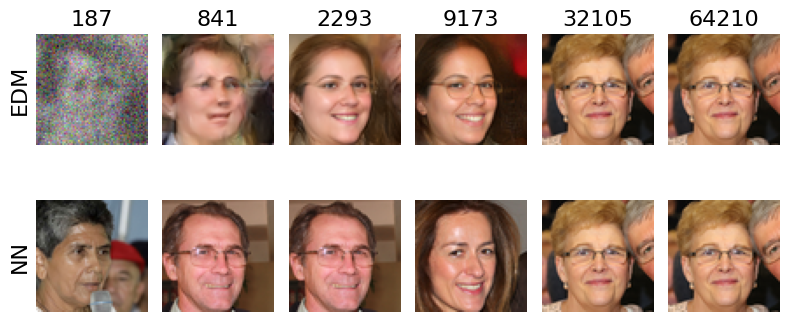

idx: 1


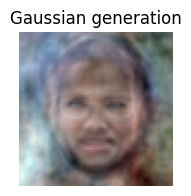

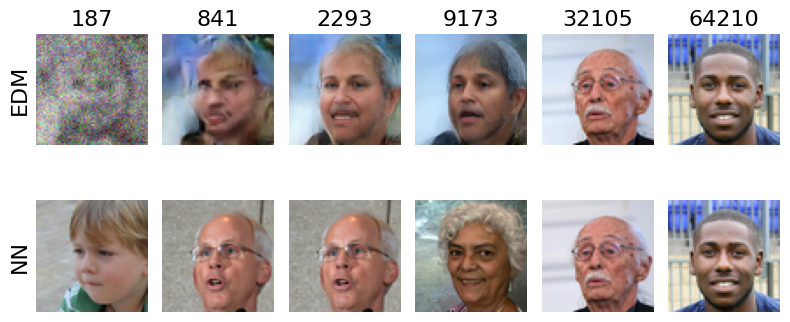

idx: 2


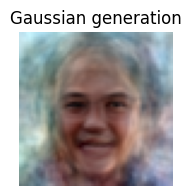

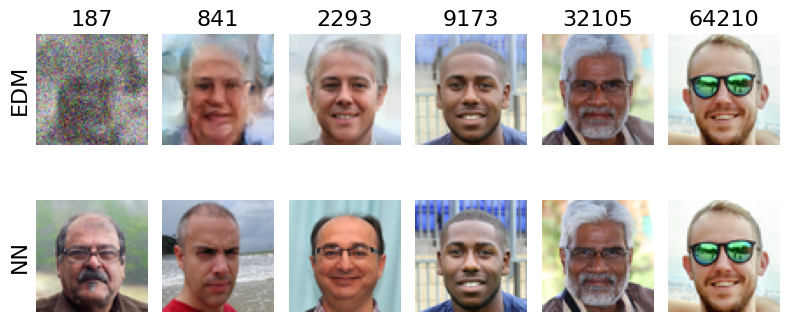

idx: 3


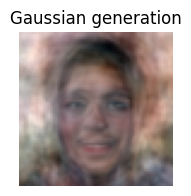

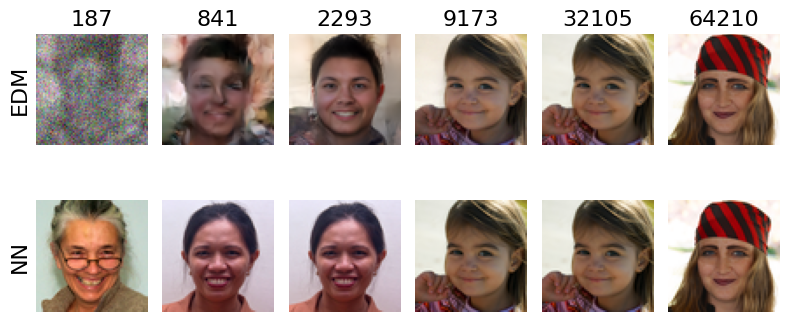

idx: 4


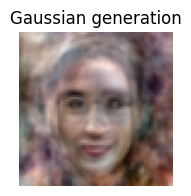

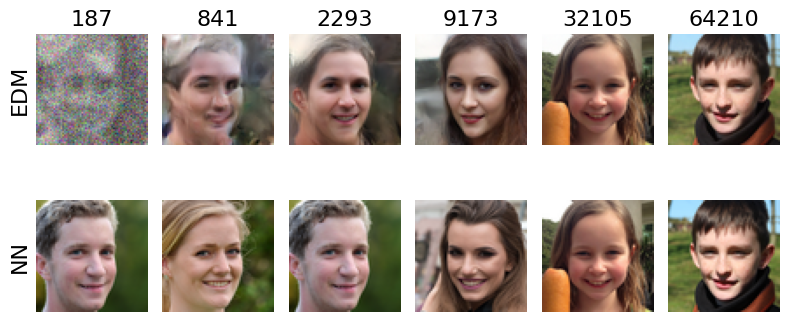

In [118]:
# Now, we are ready to visualize the generations
training_epochs = [187, 841, 2293, 9173, 32105, 64210]
num_show = 5
for idx in range(num_show):
    print('idx:',idx)
    
    plt.figure(figsize=(2,2))
    plt.title('Gaussian generation')
    plt.imshow(normalize_img(denoised_intermediates_Gaussian[-4][idx].reshape(3,64,64).cpu().permute(1,2,0)))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
    plt.figure(figsize=(8,4))
    for i in range(len(training_epochs)):
        plt.subplot(2,6,i+1)
        plt.imshow(normalize_img(generations[i][idx].reshape(3,64,64).cpu().permute(1,2,0)))
        plt.title(str(training_epochs[i]), fontsize=16)
        if i==0:
            plt.ylabel('EDM', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    for i in range(len(training_epochs)):
        plt.subplot(2,6,i+1+6)
        plt.imshow(normalize_img(nearest_neighbors[i][idx].reshape(3,64,64).cpu().permute(1,2,0)))
        #plt.title(str(image_sizes[i]))
        if i==0:
            plt.ylabel('NN', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    plt.tight_layout()
    plt.show()

### The above results demonstrate that even though large model enters memorization regime after sufficient training, during the early training iteations, they learn the Gaussian structure, generating samples that closely match those of the Gaussian model.

### Next, we focus on Sigma=4, where the EDM denoiser is highly nonlinear and significantly differs from the linear Gaussian model. Despite their differences, we will show that the EDM denoiser at this noise level still share certain degree of similarity with the linear Gaussian denoisers as they generate similar denoising outputs whether they take noisy images or pure noise as inputs.

In [119]:
torch.manual_seed(1)
num_img = 20
sigma = 4.066123602953759
rank = 1*3*64*64

denoised_img_list_pure_noise = []
denoised_img_list_noisy_image = []

noise = torch.randn((num_img,3,64,64), device=device)
img_celeb = dataset_celeb[0:num_img].reshape(-1,3,64,64).to(device)
noisy_img = img_celeb + sigma*noise

# denoising with Gaussian model
denoised_img_noise_pred_Gaussian = Gaussian_model((sigma*noise).reshape(num_img,1,-1), sigma).reshape(num_img,3,64,64)
denoised_img_noisy_image_pred_Gaussian = Gaussian_model((noisy_img).reshape(num_img,1,-1), sigma).reshape(num_img,3,64,64)

# denoising with EDM model
network_list = [net_1094_70246, net_1094_10035,  net_1094_921, net_1094_205]

for i in range(len(network_list)):
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)
        denoised_img_pure_noise_edm = get_denoised_img(sigma*noise, net, sigma, device=device)
        denoised_img_noisy_image_edm = get_denoised_img(noisy_img, net, sigma, device=device)
        denoised_img_list_pure_noise.append(denoised_img_pure_noise_edm)
        denoised_img_list_noisy_image.append(denoised_img_noisy_image_edm)

img: 0


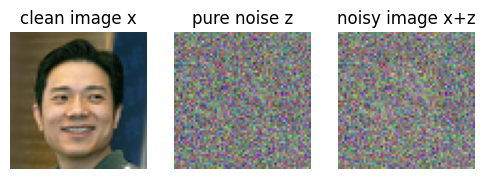

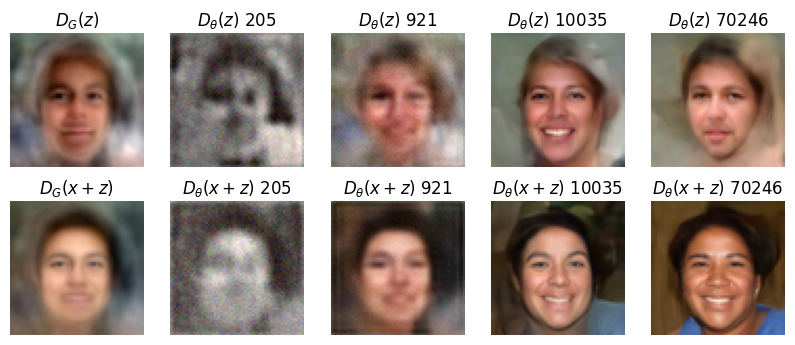

img: 1


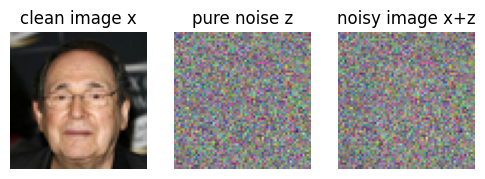

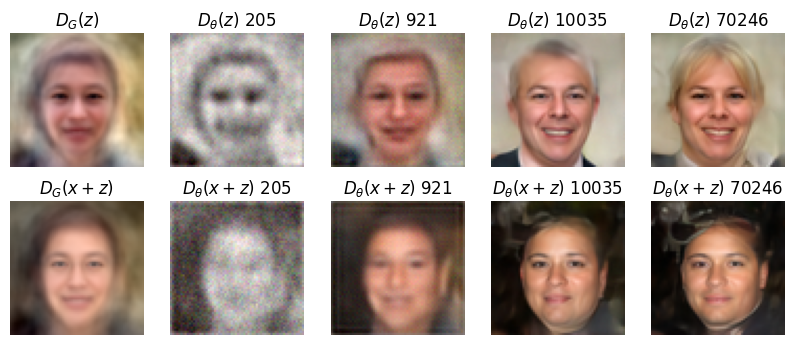

img: 2


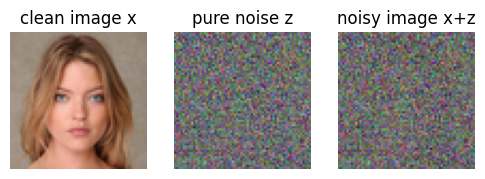

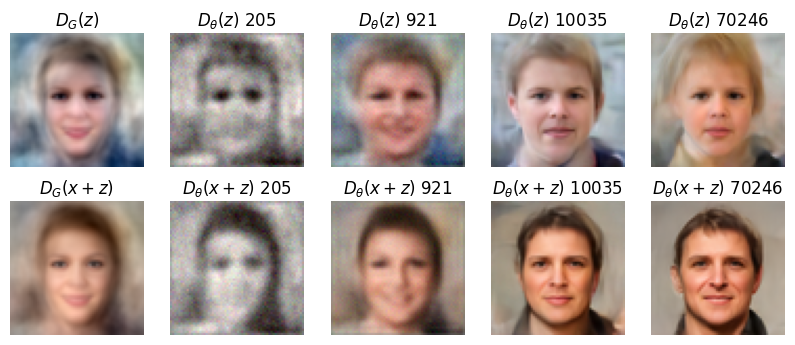

img: 3


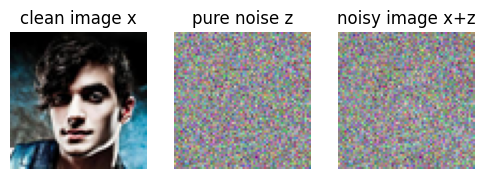

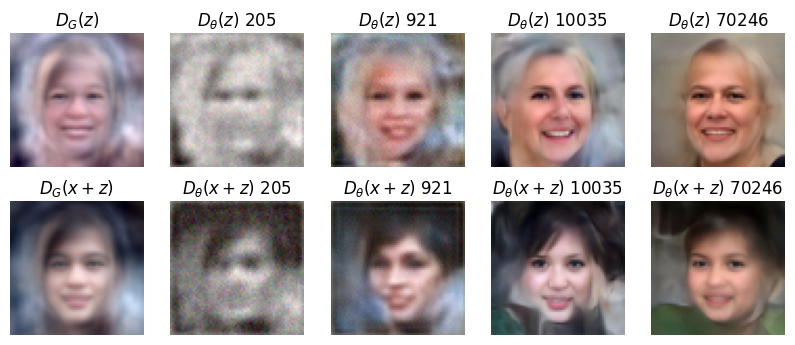

img: 4


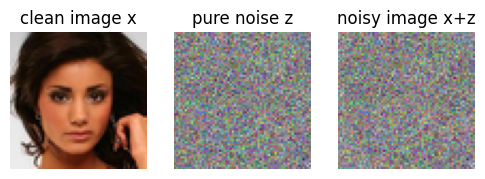

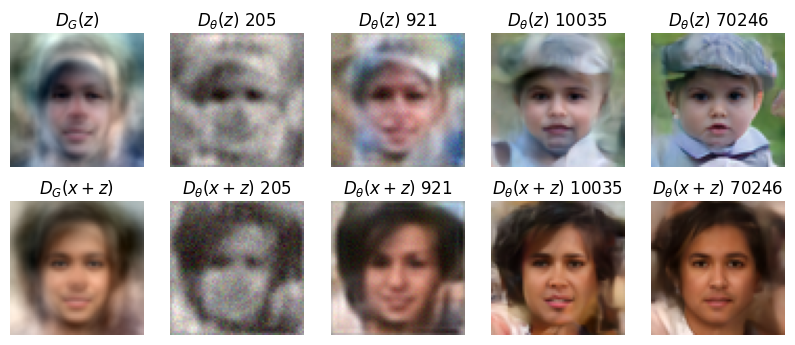

In [120]:
training_epochs = [205, 921, 10035, 70246]
num_show = 5
for i in range(num_show):
    print('img: '+str(i))
    plt.figure(figsize=(6,2))
    plt.subplot(131)
    plt.title('clean image x')
    plt.imshow(normalize_img(img_celeb[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(132)
    plt.title('pure noise z')
    plt.imshow(normalize_img(noise[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(133)
    plt.title('noisy image x+z')
    plt.imshow(normalize_img(noisy_img[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
        
    #################################################################################
    plt.figure(figsize=(10,4))
        
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1)
    plt.title(r'$D_{G}(z)$')
    plt.imshow(normalize_img(denoised_img_noise_pred_Gaussian[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_pure_noise)):
        denoised_img = denoised_img_list_pure_noise[len(denoised_img_list_pure_noise)-j-1]
        plt.subplot(2,1+len(denoised_img_list_pure_noise),1+j+1)
        plt.title(r'$D_{\theta}(z)$ '+ str(training_epochs[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.show()
    #################################################################################
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1+1*(1+len(denoised_img_list_noisy_image)))
    plt.title(r'$D_{G}(x+z)$')
    plt.imshow(normalize_img(denoised_img_noisy_image_pred_Gaussian[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_noisy_image)):
        denoised_img = denoised_img_list_noisy_image[len(denoised_img_list_noisy_image)-j-1]
        plt.subplot(2,1+len(denoised_img_list_noisy_image),1+j+1+1*(1+len(denoised_img_list_noisy_image)))
        plt.title(r'$D_{\theta}(x+z)$ '+ str(training_epochs[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,64,64).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.tight_layout()

    plt.show()

### The above results demonstrate that the diffusion denoisers are close the the Gaussian denoisers during early training iterations.

### 5. Next, we repeat the experiments on Cifar-10 dataset.

In [121]:
# Construct the Gaussian model
imgs = dataset_cifar_train
mean = torch.mean(dataset_cifar_train, dim=0)
temp = imgs-mean
covariance = temp.T@temp/temp.shape[0]
covariance = covariance.to(device)
U,S,Vh = torch.linalg.svd(covariance, full_matrices=False)
U = U.to(device)
S = S.to(device)
Vh = Vh.to(device)
mean = mean.to(device)


# You can save those data for later use, compute the covariance from scratch every time can be very expensive.
'''
save_dir = 'Covariance_Cifar/50000/'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
torch.save(mean, os.path.join(save_dir,'mean.pt'))
torch.save((U,S,Vh), os.path.join(save_dir,'covariance.pt'))
'''

Gaussian_model = multi_gaussian(mean, (U, S, Vh),3*32*32).to(device)

### Effects of training dataset size.

### We train diffusion models with fixed model cpacity (cbase = 128) on datasets with varying sizes including [50000, 25000, 12500, 3125, 782, 196] images.

In [122]:
#net_pkl_50000 = 'https://nvlabs-fi-cdn.nvidia.com/edm/pretrained/edm-cifar10-32x32-uncond-ve.pkl'
net_pkl_50000 = 'Varying_dataset_size/Cifar/50000_scale_128/network-snapshot-195686.pkl'
net_pkl_25000 = 'Varying_dataset_size/Cifar/25000_scale_128/network-snapshot-195686.pkl'
net_pkl_12500 = 'Varying_dataset_size/Cifar/12500_scale_128/network-snapshot-195686.pkl'
net_pkl_3125 = 'Varying_dataset_size/Cifar/3125_scale_128/network-snapshot-195686.pkl'
net_pkl_782 = 'Varying_dataset_size/Cifar/782_scale_128/network-snapshot-195686.pkl'
net_pkl_196 = 'Varying_dataset_size/Cifar/196_scale_128/network-snapshot-195686.pkl'
network_list = [net_pkl_196, net_pkl_782, net_pkl_3125, net_pkl_12500, net_pkl_25000, net_pkl_50000]

In [123]:
torch.manual_seed(0)

# # Construct the class for finding nearest neighbors
nn_finder = KnnFinder(data_path_3)


# Construct initial noise
latents = torch.randn(20,3,32,32).to(device)
num_steps = 10

# Generate images with EDM models and finding the corresponding nearest neighbors
generations = []
nearest_neighbors = []

for i in range(len(network_list)):
    # Construct Diffusion models
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)     
    sigma_list, intermediates_edm, denoised_intermediates_edm = generate_image(net, latents ,num_steps=num_steps, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)
    generations.append(denoised_intermediates_edm[-1])

    # Find the nearest neighbors of the generated images
    temp = torch.stack(denoised_intermediates_edm)[-1].cuda()
    descending_index, _ = nn_finder(temp, sigma=torch.tensor(1).to(device)) # sigma here is a dummy variable, any positive input should work
    nn = dataset_cifar_train[descending_index[:,0],:]    
    nearest_neighbors.append(nn)
    
# Generate images with the Gaussian diffusion mdoel. Here we only construct Gaussian model from dataset with size 70000 (full FFHQ dataset) but in the paper we construct the Gaussian models from datasets of varying sizes.
sigma_list, intermediates_Gaussian, denoised_intermediates_Gaussian = generate_image_Gaussian(net, Gaussian_model, latents.reshape(-1,3*32*32) ,num_steps=10, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)

100%|██████████| 10/10 [00:00<00:00, 85.19step/s]


idx: 0


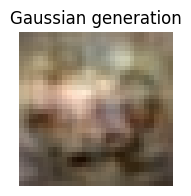

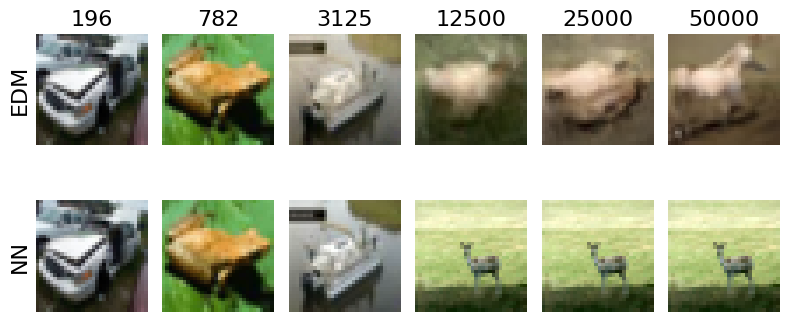

idx: 1


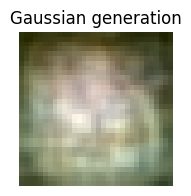

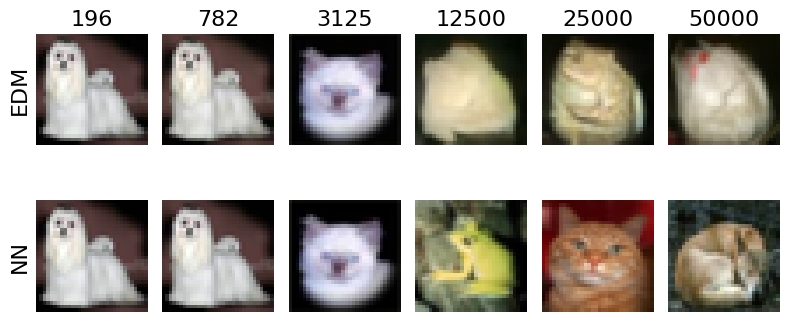

idx: 2


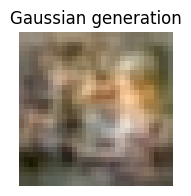

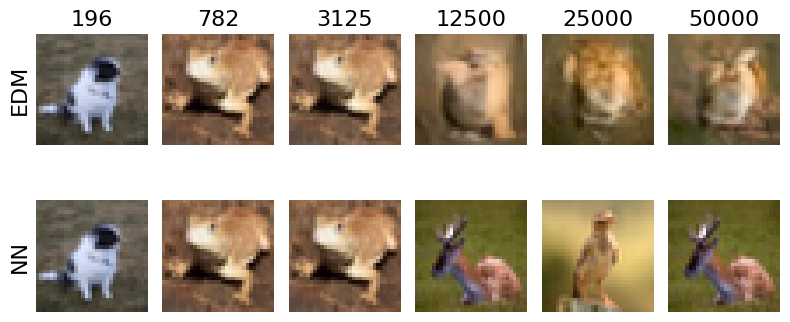

idx: 3


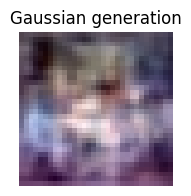

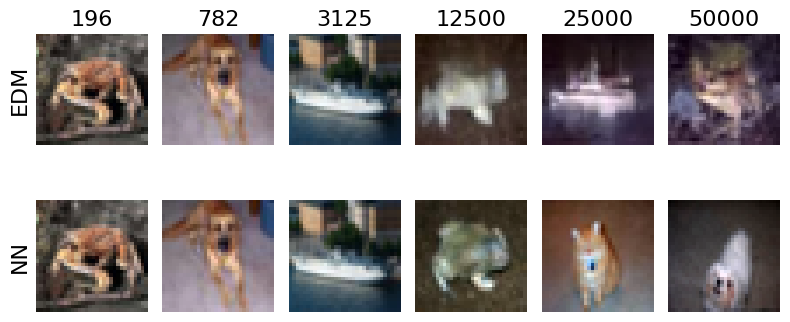

idx: 4


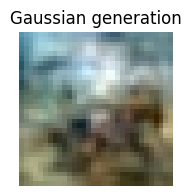

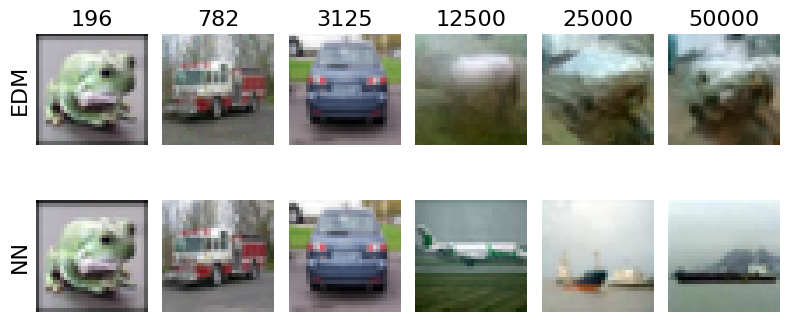

In [124]:
# Now, we are ready to visualize the generations
dataset_sizes = [196, 782, 3125, 12500, 25000, 50000]
num_show = 5
for idx in range(num_show):
    print('idx:',idx)
    
    plt.figure(figsize=(2,2))
    plt.title('Gaussian generation')
    plt.imshow(normalize_img(denoised_intermediates_Gaussian[-4][idx].reshape(3,32,32).cpu().permute(1,2,0)))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
    plt.figure(figsize=(8,4))
    for i in range(len(dataset_sizes)):
        plt.subplot(2,6,i+1)
        plt.imshow(normalize_img(generations[i][idx].reshape(3,32,32).cpu().permute(1,2,0)))
        plt.title(str(dataset_sizes[i]), fontsize=16)
        if i==0:
            plt.ylabel('EDM', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    for i in range(len(dataset_sizes)):
        plt.subplot(2,6,i+1+6)
        plt.imshow(normalize_img(nearest_neighbors[i][idx].reshape(3,32,32).cpu().permute(1,2,0)))
        #plt.title(str(image_sizes[i]))
        if i==0:
            plt.ylabel('NN', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    plt.tight_layout()
    plt.show()

In [125]:
torch.manual_seed(0)
num_img = 20
sigma = 2 #4.066123602953759
rank = 1*3*32*32

denoised_img_list_pure_noise = []
denoised_img_list_noisy_image = []

noise = torch.randn((num_img,3,32,32), device=device)
img_cifar = dataset_cifar_test[0:num_img].reshape(-1,3,32,32).to(device)
noisy_img = img_cifar + sigma*noise

# denoising with Gaussian model
denoised_img_noise_pred_Gaussian = Gaussian_model((sigma*noise).reshape(num_img,1,-1), sigma).reshape(num_img,3,32,32)
denoised_img_noisy_image_pred_Gaussian = Gaussian_model((noisy_img).reshape(num_img,1,-1), sigma).reshape(num_img,3,32,32)

# denoising with EDM model
network_list = [net_pkl_196, net_pkl_782, net_pkl_25000, net_pkl_50000]

for i in range(len(network_list)):
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)
        denoised_img_pure_noise_edm = get_denoised_img(sigma*noise, net, sigma, device=device)
        denoised_img_noisy_image_edm = get_denoised_img(noisy_img, net, sigma, device=device)
        denoised_img_list_pure_noise.append(denoised_img_pure_noise_edm)
        denoised_img_list_noisy_image.append(denoised_img_noisy_image_edm)

img: 0


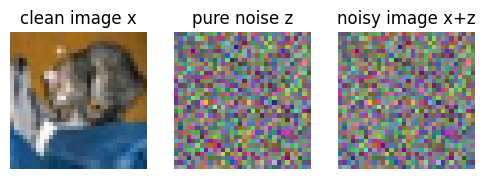

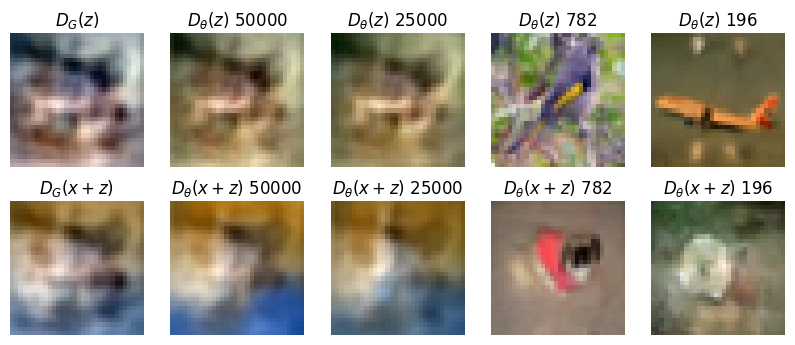

img: 1


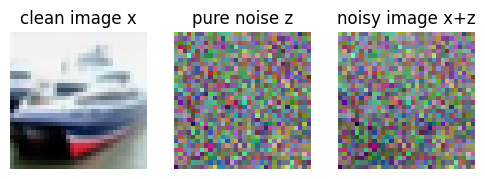

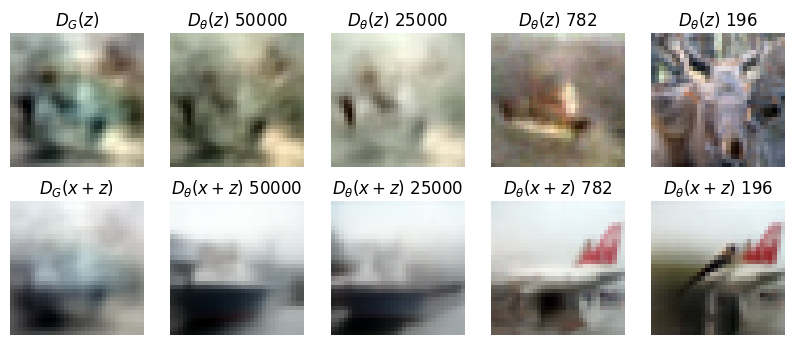

img: 2


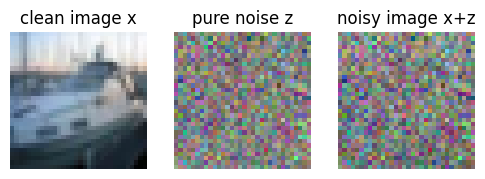

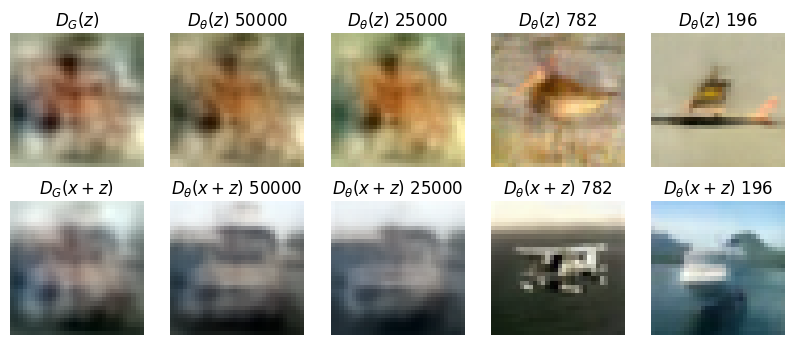

img: 3


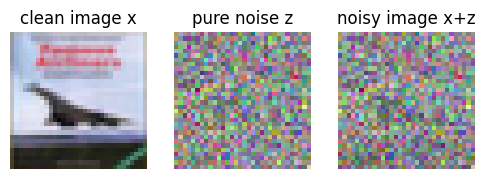

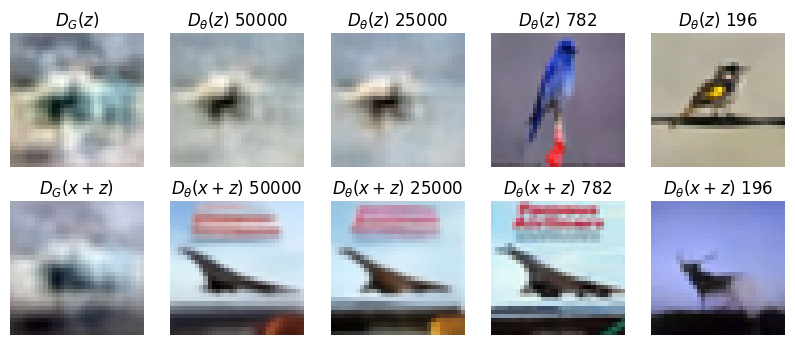

img: 4


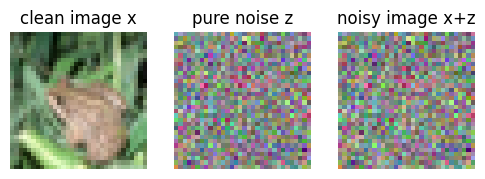

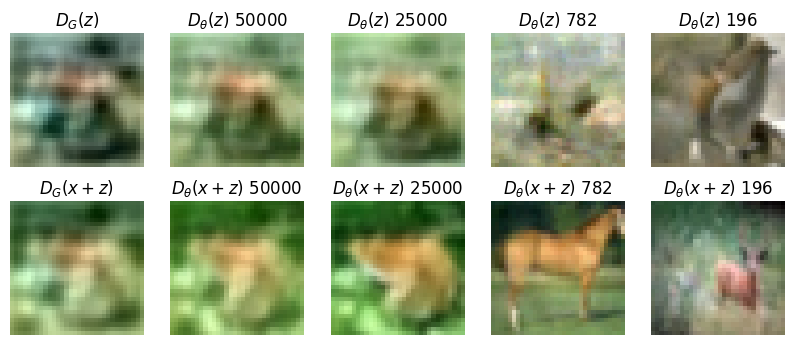

In [126]:
image_sizes = [50000, 25000, 782, 196]
num_show = 5
for i in range(num_show):
    print('img: '+str(i))
    plt.figure(figsize=(6,2))
    plt.subplot(131)
    plt.title('clean image x')
    plt.imshow(normalize_img(img_cifar[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(132)
    plt.title('pure noise z')
    plt.imshow(normalize_img(noise[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(133)
    plt.title('noisy image x+z')
    plt.imshow(normalize_img(noisy_img[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
        
    #################################################################################
    plt.figure(figsize=(10,4))
        
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1)
    plt.title(r'$D_{G}(z)$')
    plt.imshow(normalize_img(denoised_img_noise_pred_Gaussian[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_pure_noise)):
        denoised_img = denoised_img_list_pure_noise[len(denoised_img_list_pure_noise)-j-1]
        plt.subplot(2,1+len(denoised_img_list_pure_noise),1+j+1)
        plt.title(r'$D_{\theta}(z)$ '+ str(image_sizes[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.show()
    #################################################################################
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1+1*(1+len(denoised_img_list_noisy_image)))
    plt.title(r'$D_{G}(x+z)$')
    plt.imshow(normalize_img(denoised_img_noisy_image_pred_Gaussian[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_noisy_image)):
        denoised_img = denoised_img_list_noisy_image[len(denoised_img_list_noisy_image)-j-1]
        plt.subplot(2,1+len(denoised_img_list_noisy_image),1+j+1+1*(1+len(denoised_img_list_noisy_image)))
        plt.title(r'$D_{\theta}(x+z)$ '+ str(image_sizes[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.tight_layout()

    plt.show()

### Next, we study the effects of model capacity. We fix the trianing dataset size as 782 and train diffusion models with different scale (cbase parameter) including [4, 8, 16, 32, 64]

In [127]:
net_782_4 = 'Varying_model_scale/Cifar/782-set1-scale_4/network-snapshot-200000.pkl'
net_782_8 = 'Varying_model_scale/Cifar/782-set1-scale_8/network-snapshot-200000.pkl'
net_782_16 = 'Varying_model_scale/Cifar/782-set1-scale_16/network-snapshot-200000.pkl'
net_782_32 = 'Varying_model_scale/Cifar/782-set1-scale_32/network-snapshot-200000.pkl'
net_782_64 = 'Varying_model_scale/Cifar/782-set1-scale_64/network-snapshot-200000.pkl'
net_782_128 = 'Varying_model_scale/Cifar/782-set1-scale_128/network-snapshot-195686.pkl'
network_list = [net_782_128, net_782_64, net_782_32, net_782_16, net_782_8, net_782_4]

In [128]:
torch.manual_seed(0)

# # Construct the class for finding nearest neighbors
nn_finder = KnnFinder(data_path_3)


# Construct initial noise
latents = torch.randn(20,3,32,32).to(device)
num_steps = 10

# Generate images with EDM models and finding the corresponding nearest neighbors
generations = []
nearest_neighbors = []

for i in range(len(network_list)):
    # Construct Diffusion models
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)     
    sigma_list, intermediates_edm, denoised_intermediates_edm = generate_image(net, latents ,num_steps=num_steps, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)
    generations.append(denoised_intermediates_edm[-1])

    # Find the nearest neighbors of the generated images
    temp = torch.stack(denoised_intermediates_edm)[-1].cuda()
    descending_index, _ = nn_finder(temp, sigma=torch.tensor(1).to(device)) # sigma here is a dummy variable, any positive input should work
    nn = dataset_cifar_train[descending_index[:,0],:]    
    nearest_neighbors.append(nn)
    
# Generate images with the Gaussian diffusion mdoel. Here we only construct Gaussian model from dataset with size 70000 (full FFHQ dataset) but in the paper we construct the Gaussian models from datasets of varying sizes.
sigma_list, intermediates_Gaussian, denoised_intermediates_Gaussian = generate_image_Gaussian(net, Gaussian_model, latents.reshape(-1,3*32*32) ,num_steps=10, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)

100%|██████████| 10/10 [00:00<00:00, 84.00step/s]


idx: 0


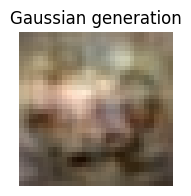

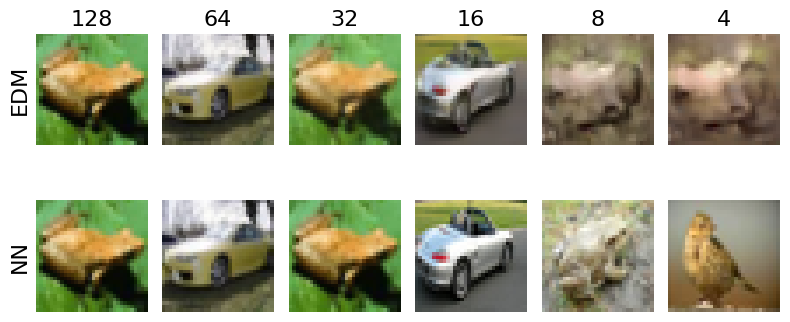

idx: 1


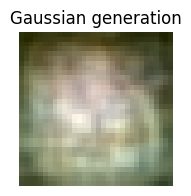

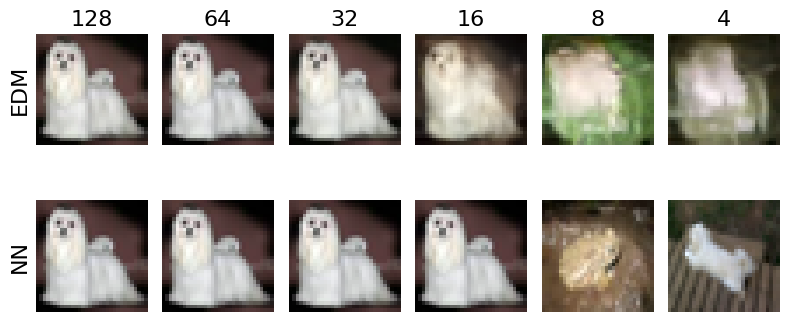

idx: 2


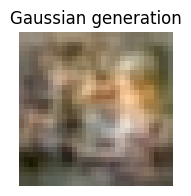

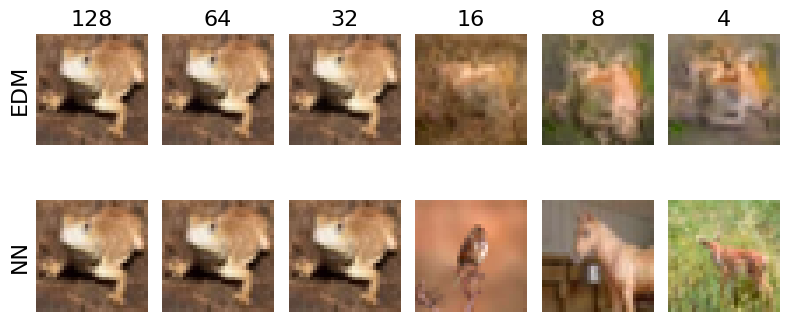

idx: 3


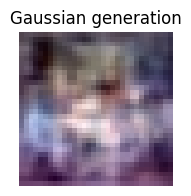

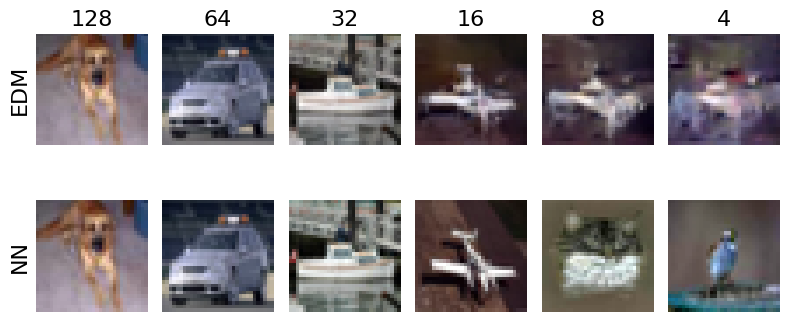

idx: 4


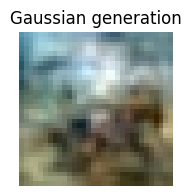

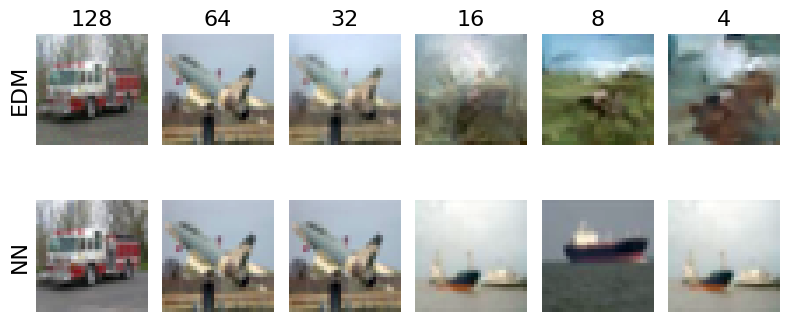

In [129]:
# Now, we are ready to visualize the generations
model_scales = [128, 64, 32, 16, 8, 4]
num_show = 5 
for idx in range(num_show):
    print('idx:',idx)
    
    plt.figure(figsize=(2,2))
    plt.title('Gaussian generation')
    plt.imshow(normalize_img(denoised_intermediates_Gaussian[-4][idx].reshape(3,32,32).cpu().permute(1,2,0)))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
    plt.figure(figsize=(8,4))
    for i in range(len(model_scales)):
        plt.subplot(2,6,i+1)
        plt.imshow(normalize_img(generations[i][idx].reshape(3,32,32).cpu().permute(1,2,0)))
        plt.title(str(model_scales[i]), fontsize=16)
        if i==0:
            plt.ylabel('EDM', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    for i in range(len(model_scales)):
        plt.subplot(2,6,i+1+6)
        plt.imshow(normalize_img(nearest_neighbors[i][idx].reshape(3,32,32).cpu().permute(1,2,0)))
        #plt.title(str(image_sizes[i]))
        if i==0:
            plt.ylabel('NN', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    plt.tight_layout()
    plt.show()

In [132]:
torch.manual_seed(0)
num_img = 20
sigma = 2#4.066123602953759
rank = 1*3*32*32

denoised_img_list_pure_noise = []
denoised_img_list_noisy_image = []

noise = torch.randn((num_img,3,32,32), device=device)
img_cifar = dataset_cifar_test[0:num_img].reshape(-1,3,32,32).to(device)
noisy_img = img_cifar + sigma*noise

# denoising with Gaussian model
denoised_img_noise_pred_Gaussian = Gaussian_model((sigma*noise).reshape(num_img,1,-1), sigma).reshape(num_img,3,32,32)
denoised_img_noisy_image_pred_Gaussian = Gaussian_model((noisy_img).reshape(num_img,1,-1), sigma).reshape(num_img,3,32,32)

# denoising with EDM model
network_list = [net_782_128, net_782_64,  net_782_8, net_782_4]

for i in range(len(network_list)):
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)
        denoised_img_pure_noise_edm = get_denoised_img(sigma*noise, net, sigma, device=device)
        denoised_img_noisy_image_edm = get_denoised_img(noisy_img, net, sigma, device=device)
        denoised_img_list_pure_noise.append(denoised_img_pure_noise_edm)
        denoised_img_list_noisy_image.append(denoised_img_noisy_image_edm)

img: 0


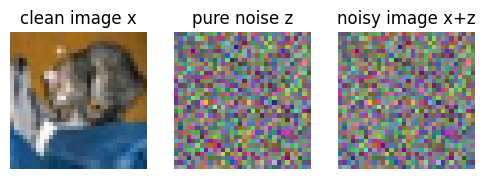

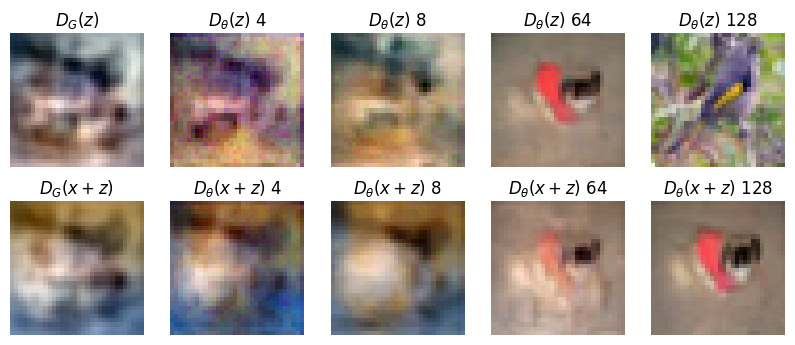

img: 1


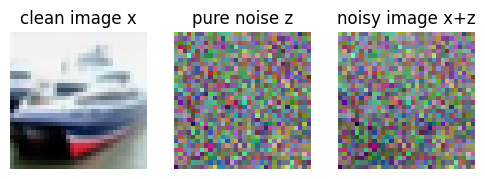

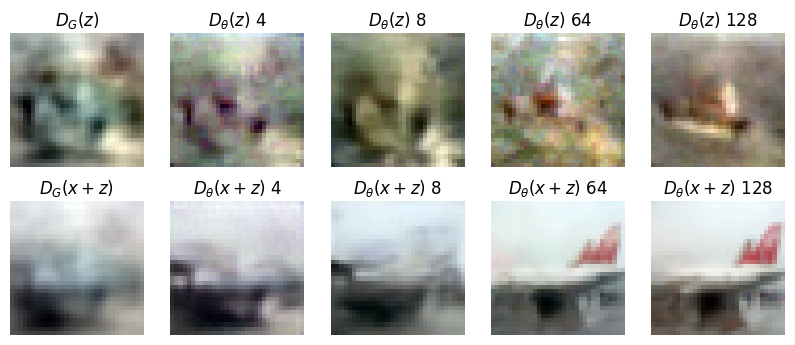

img: 2


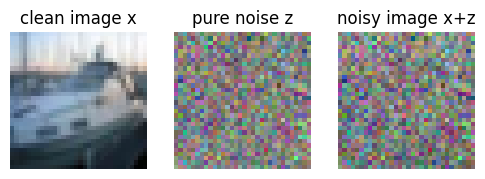

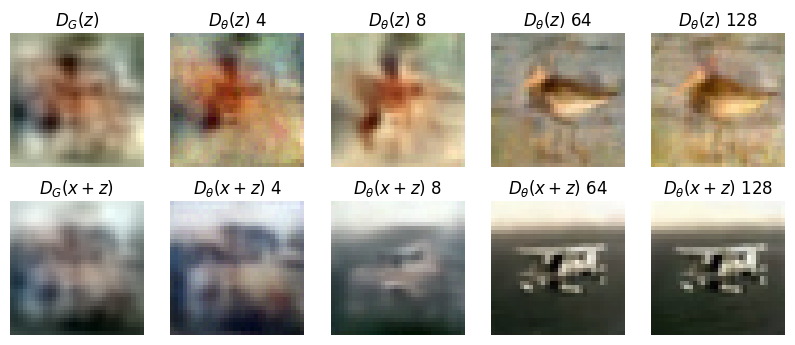

img: 3


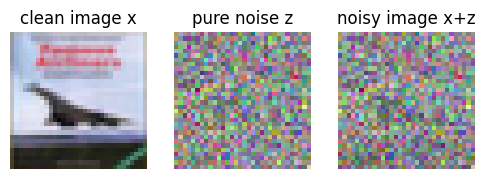

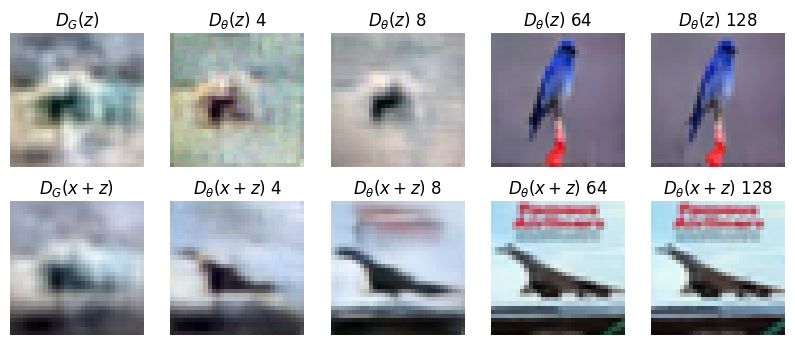

img: 4


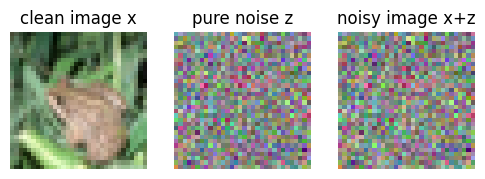

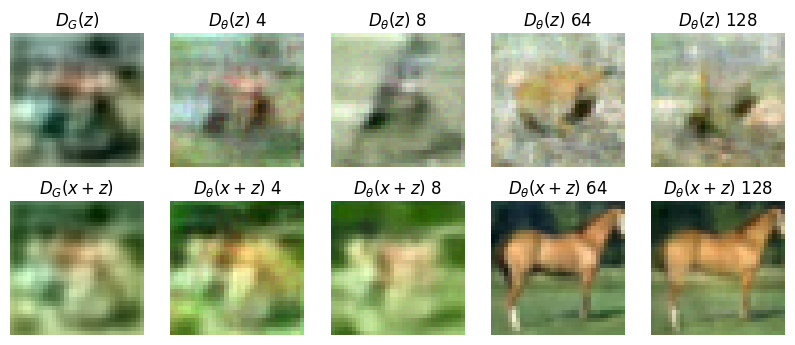

In [133]:
model_scales = [4, 8, 64, 128]
num_show = 5
for i in range(num_show):
    print('img: '+str(i))
    plt.figure(figsize=(6,2))
    plt.subplot(131)
    plt.title('clean image x')
    plt.imshow(normalize_img(img_cifar[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(132)
    plt.title('pure noise z')
    plt.imshow(normalize_img(noise[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(133)
    plt.title('noisy image x+z')
    plt.imshow(normalize_img(noisy_img[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
        
    #################################################################################
    plt.figure(figsize=(10,4))
        
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1)
    plt.title(r'$D_{G}(z)$')
    plt.imshow(normalize_img(denoised_img_noise_pred_Gaussian[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_pure_noise)):
        denoised_img = denoised_img_list_pure_noise[len(denoised_img_list_pure_noise)-j-1]
        plt.subplot(2,1+len(denoised_img_list_pure_noise),1+j+1)
        plt.title(r'$D_{\theta}(z)$ '+ str(model_scales[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.show()
    #################################################################################
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1+1*(1+len(denoised_img_list_noisy_image)))
    plt.title(r'$D_{G}(x+z)$')
    plt.imshow(normalize_img(denoised_img_noisy_image_pred_Gaussian[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_noisy_image)):
        denoised_img = denoised_img_list_noisy_image[len(denoised_img_list_noisy_image)-j-1]
        plt.subplot(2,1+len(denoised_img_list_noisy_image),1+j+1+1*(1+len(denoised_img_list_noisy_image)))
        plt.title(r'$D_{\theta}(x+z)$ '+ str(model_scales[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.tight_layout()

    plt.show()

### Lastly, we show Gaussian structure emerges in early training epochs. We fix the training dataset size as 782 and model cpacity as 128. We record the intermediate network snapshots, where the index stands for the number of images that have been 'seen' by the network. For example, 205 stands for the model has been trained on 205k images. SInce the dataset size is 782, the corresponding training epoch is 205k/782 = 262.

In [134]:
net_782_205 = 'Varying_training_epochs/Cifar/782/network-snapshot-000205.pkl'
net_782_563 = 'Varying_training_epochs/Cifar/782/network-snapshot-000563.pkl'
net_782_921 = 'Varying_training_epochs/Cifar/782/network-snapshot-000921.pkl'
net_782_2509 = 'Varying_training_epochs/Cifar/782/network-snapshot-002509.pkl'
net_782_10035 = 'Varying_training_epochs/Cifar/782/network-snapshot-010035.pkl'
net_782_70246 = 'Varying_training_epochs/Cifar/782/network-snapshot-070246.pkl'
network_list = [net_782_205, net_782_563, net_782_921, net_782_2509, net_782_10035, net_782_70246]

In [135]:
torch.manual_seed(0)

# # Construct the class for finding nearest neighbors
nn_finder = KnnFinder(data_path_3)


# Construct initial noise
latents = torch.randn(20,3,32,32).to(device)
num_steps = 10

# Generate images with EDM models and finding the corresponding nearest neighbors
generations = []
nearest_neighbors = []

for i in range(len(network_list)):
    # Construct Diffusion models
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)     
    sigma_list, intermediates_edm, denoised_intermediates_edm = generate_image(net, latents ,num_steps=num_steps, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)
    generations.append(denoised_intermediates_edm[-1])

    # Find the nearest neighbors of the generated images
    temp = torch.stack(denoised_intermediates_edm)[-1].cuda()
    descending_index, _ = nn_finder(temp, sigma=torch.tensor(1).to(device)) # sigma here is a dummy variable, any positive input should work
    nn = dataset_cifar_train[descending_index[:,0],:]    
    nearest_neighbors.append(nn)
    
# Generate images with the Gaussian diffusion mdoel. Here we only construct Gaussian model from dataset with size 70000 (full FFHQ dataset) but in the paper we construct the Gaussian models from datasets of varying sizes.
sigma_list, intermediates_Gaussian, denoised_intermediates_Gaussian = generate_image_Gaussian(net, Gaussian_model, latents.reshape(-1,3*32*32) ,num_steps=10, sigma_min=0.002, sigma_max=80, rho=7,S_churn=0, S_min=0, S_max=float('inf'), S_noise=0, device=device)

100%|██████████| 10/10 [00:00<00:00, 84.55step/s]


idx: 0


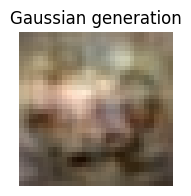

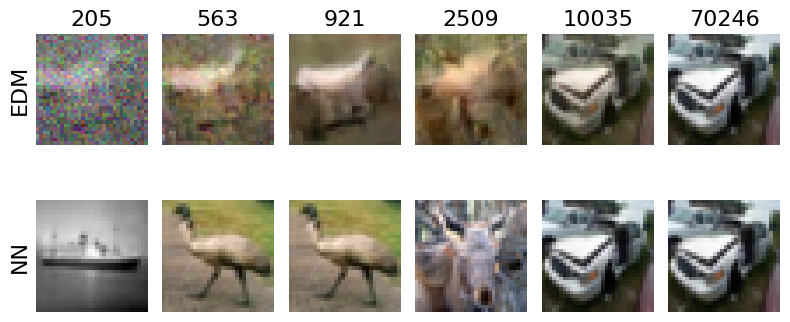

idx: 1


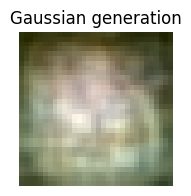

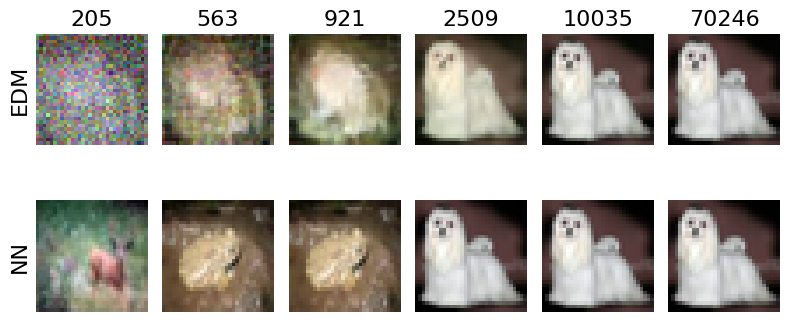

idx: 2


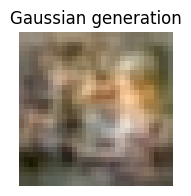

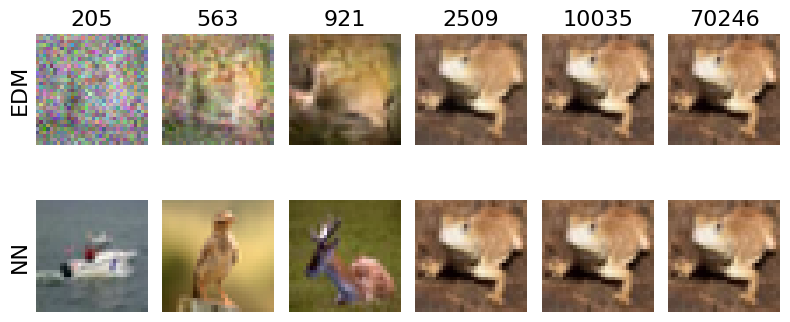

idx: 3


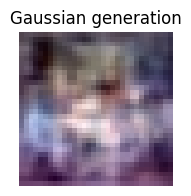

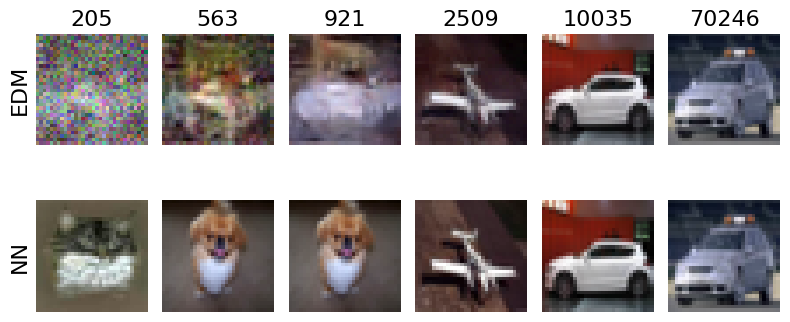

idx: 4


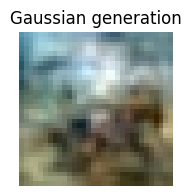

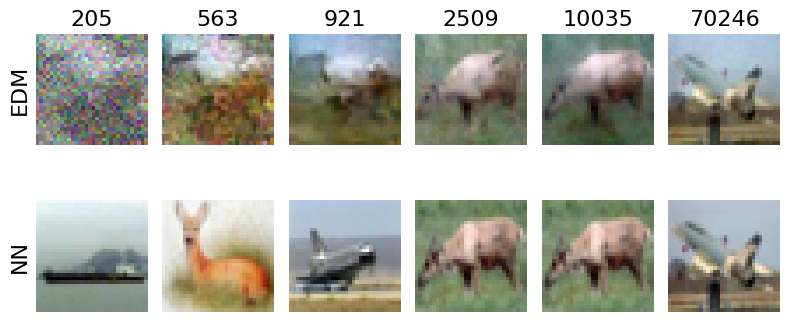

In [136]:
# Now, we are ready to visualize the generations
training_epochs = [205, 563, 921, 2509, 10035, 70246]
num_show = 5
for idx in range(num_show):
    print('idx:',idx)
    
    plt.figure(figsize=(2,2))
    plt.title('Gaussian generation')
    plt.imshow(normalize_img(denoised_intermediates_Gaussian[-4][idx].reshape(3,32,32).cpu().permute(1,2,0)))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
    plt.figure(figsize=(8,4))
    for i in range(len(training_epochs)):
        plt.subplot(2,6,i+1)
        plt.imshow(normalize_img(generations[i][idx].reshape(3,32,32).cpu().permute(1,2,0)))
        plt.title(str(training_epochs[i]), fontsize=16)
        if i==0:
            plt.ylabel('EDM', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    for i in range(len(training_epochs)):
        plt.subplot(2,6,i+1+6)
        plt.imshow(normalize_img(nearest_neighbors[i][idx].reshape(3,32,32).cpu().permute(1,2,0)))
        #plt.title(str(image_sizes[i]))
        if i==0:
            plt.ylabel('NN', fontsize=16)
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 

    plt.tight_layout()
    plt.show()

In [139]:
torch.manual_seed(0)
num_img = 20
sigma = 2
rank = 1*3*32*32

denoised_img_list_pure_noise = []
denoised_img_list_noisy_image = []

noise = torch.randn((num_img,3,32,32), device=device)
img_cifar = dataset_cifar_test[0:num_img].reshape(-1,3,32,32).to(device)
noisy_img = img_cifar + sigma*noise

# denoising with Gaussian model
denoised_img_noise_pred_Gaussian = Gaussian_model((sigma*noise).reshape(num_img,1,-1), sigma).reshape(num_img,3,32,32)
denoised_img_noisy_image_pred_Gaussian = Gaussian_model((noisy_img).reshape(num_img,1,-1), sigma).reshape(num_img,3,32,32)

# denoising with EDM model
network_list = [net_782_70246, net_782_10035,  net_782_921, net_782_563, net_782_205]

for i in range(len(network_list)):
    net_pkl = network_list[i]
    with dnnlib.util.open_url(net_pkl) as f:
        net = pickle.load(f)['ema'].to(device)
        denoised_img_pure_noise_edm = get_denoised_img(sigma*noise, net, sigma, device=device)
        denoised_img_noisy_image_edm = get_denoised_img(noisy_img, net, sigma, device=device)
        denoised_img_list_pure_noise.append(denoised_img_pure_noise_edm)
        denoised_img_list_noisy_image.append(denoised_img_noisy_image_edm)

img: 0


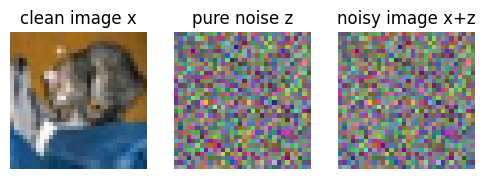

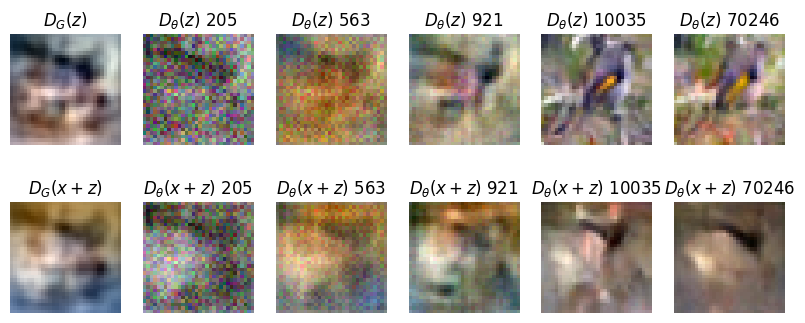

img: 1


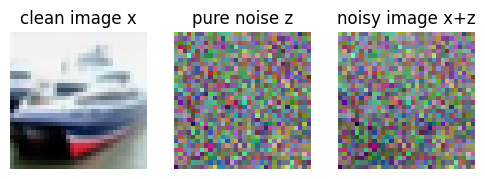

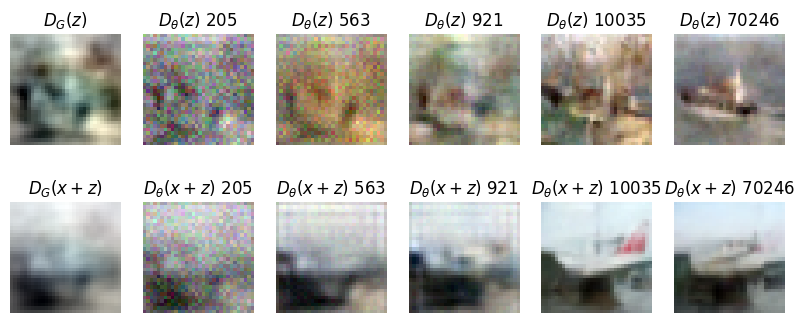

img: 2


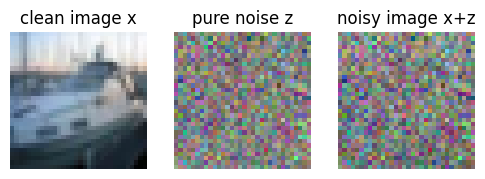

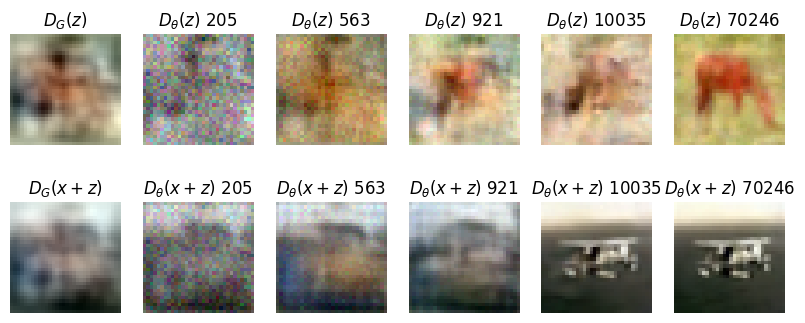

img: 3


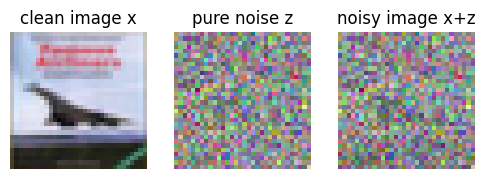

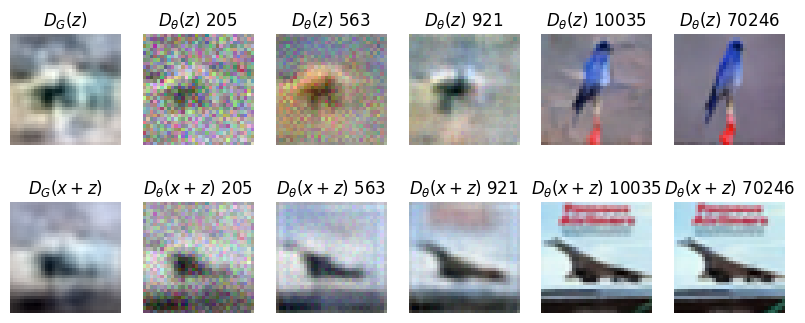

img: 4


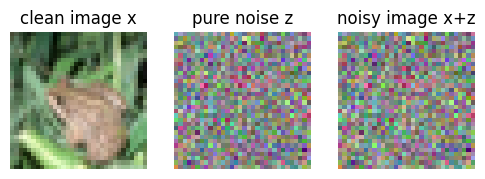

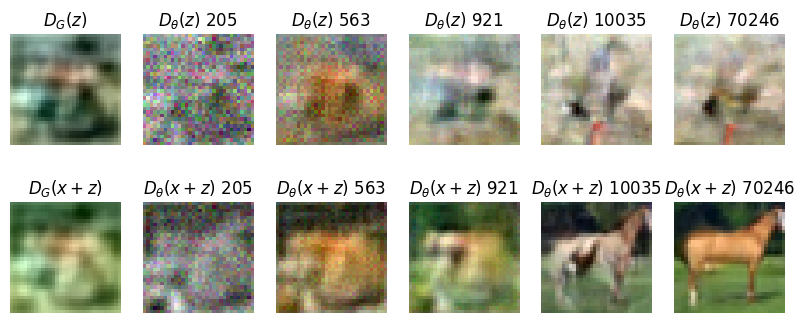

img: 5


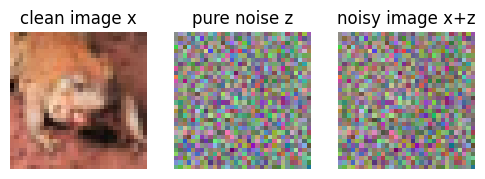

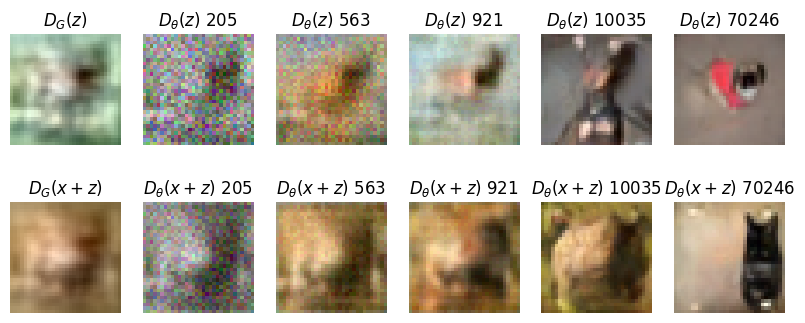

img: 6


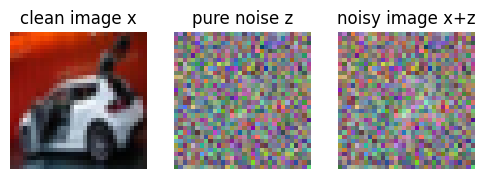

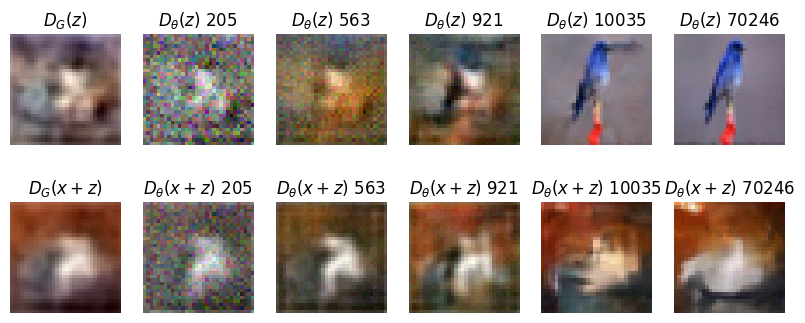

img: 7


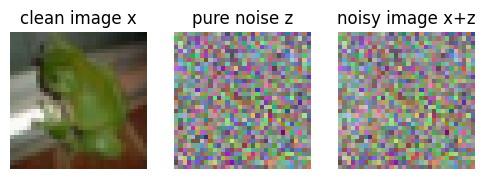

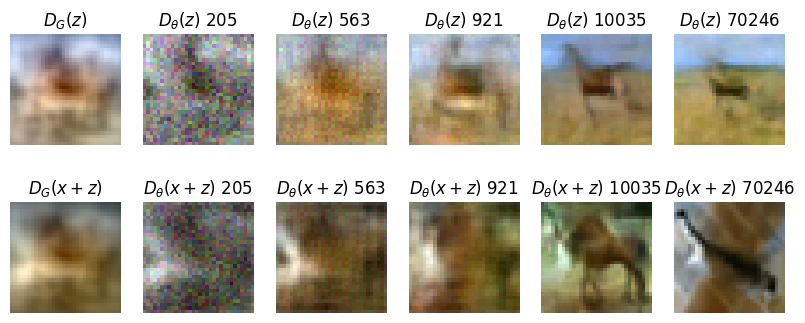

img: 8


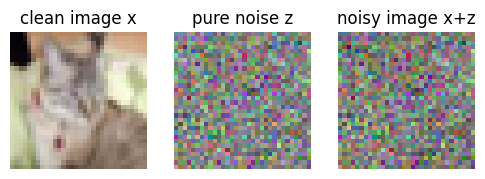

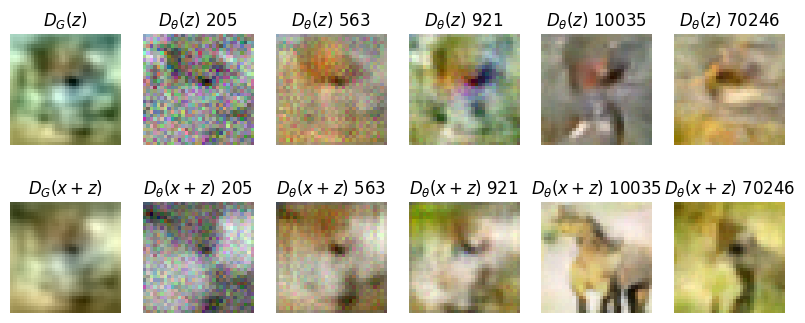

img: 9


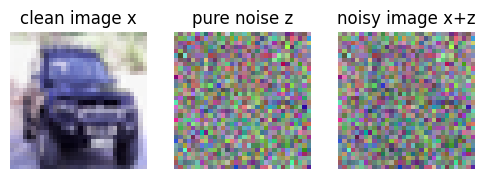

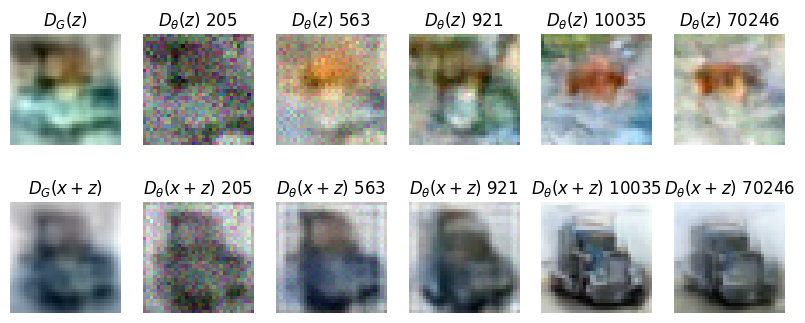

img: 10


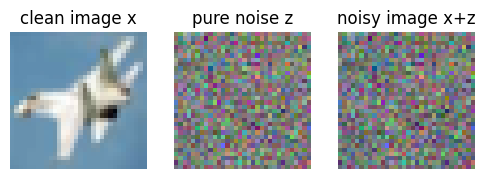

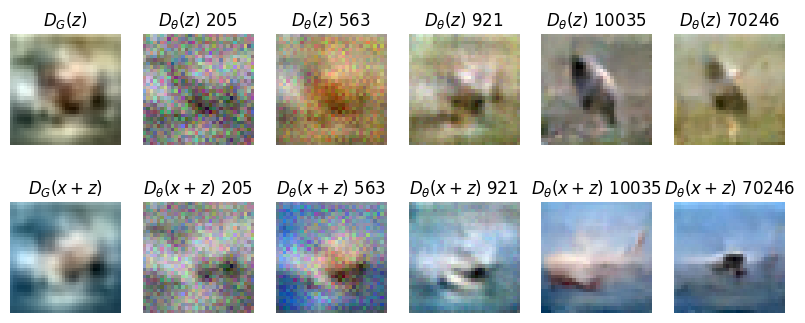

img: 11


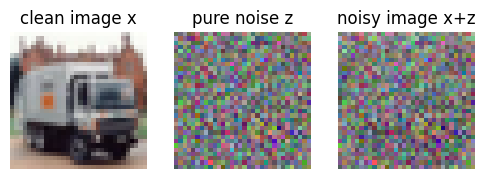

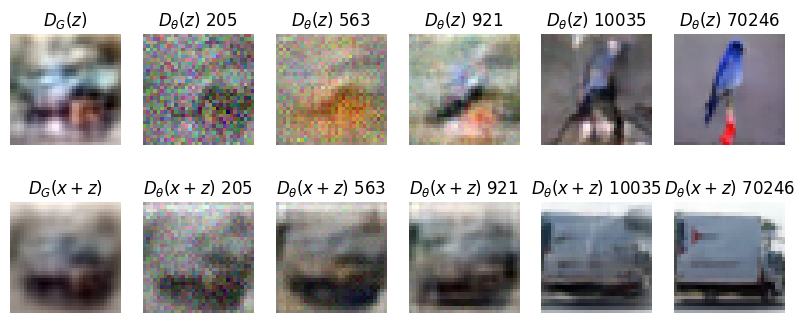

img: 12


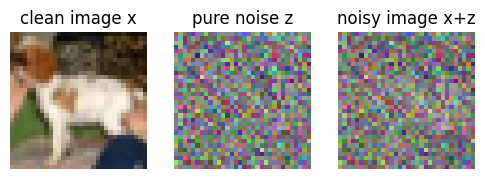

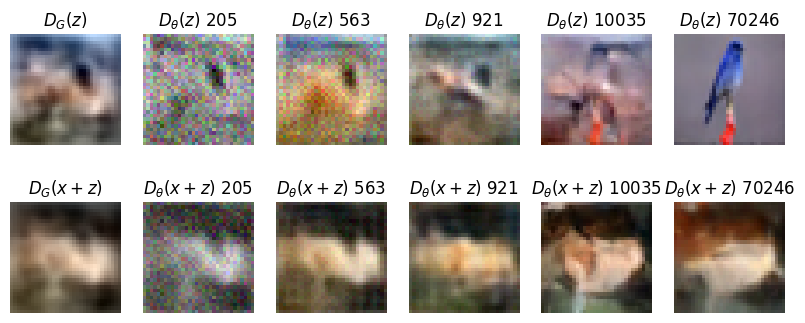

img: 13


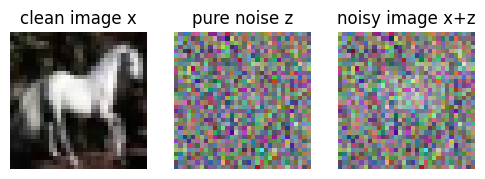

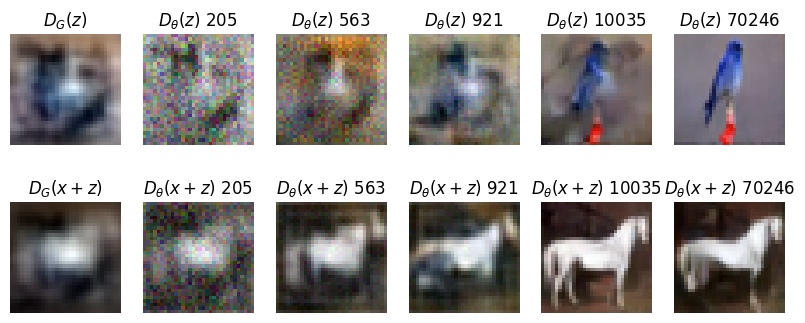

img: 14


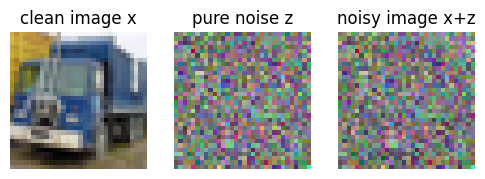

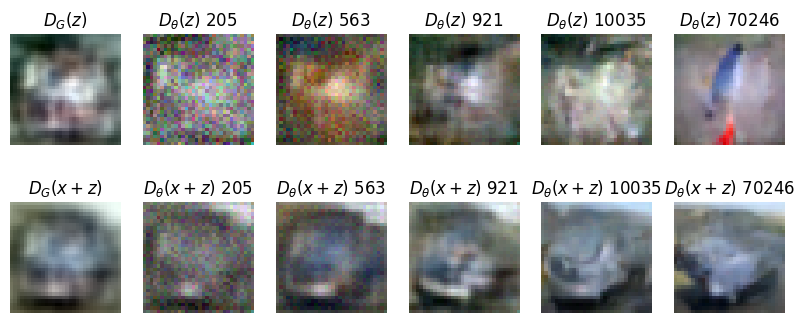

img: 15


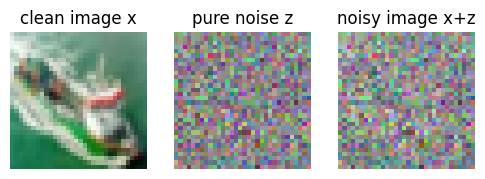

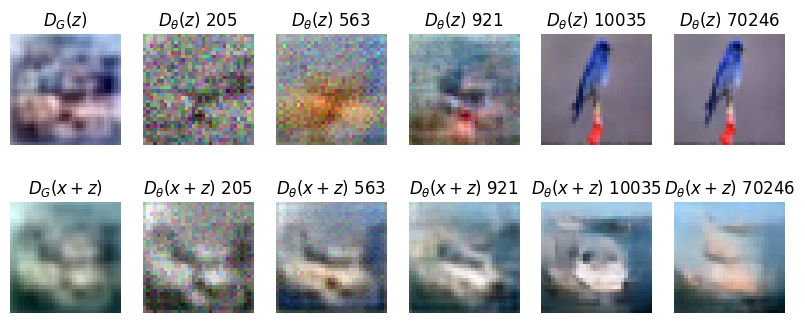

img: 16


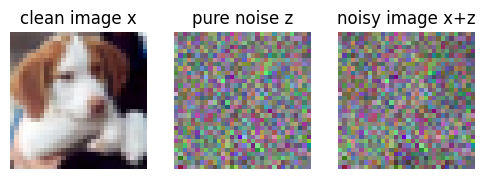

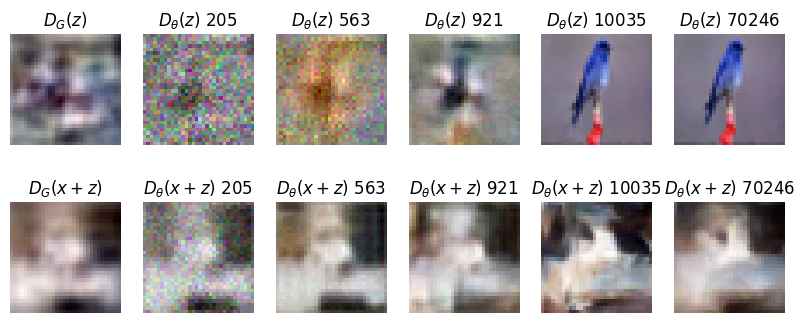

img: 17


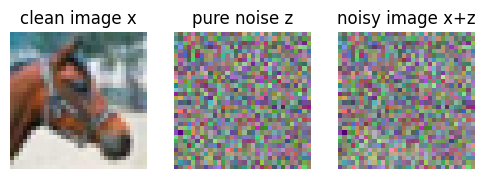

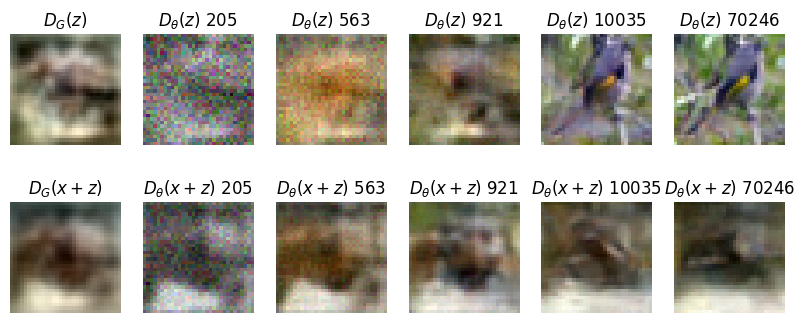

img: 18


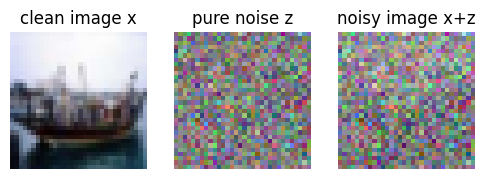

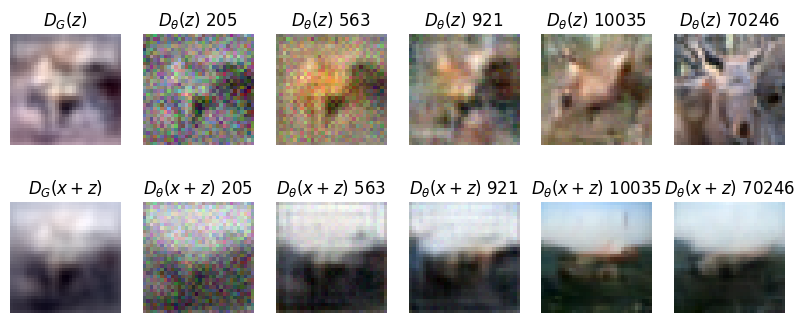

img: 19


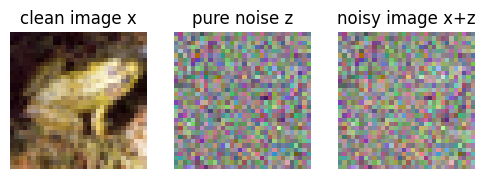

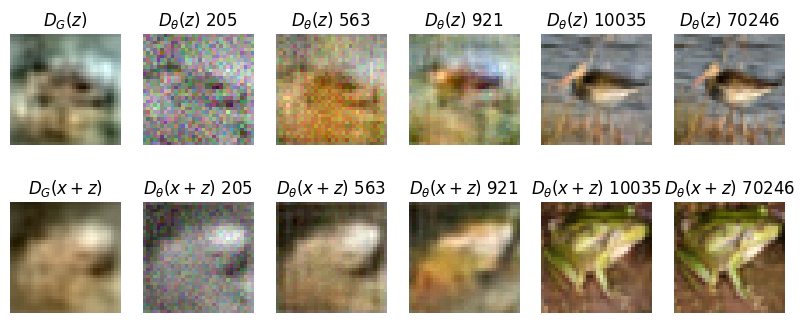

In [140]:
training_epochs = [205, 563, 921, 10035, 70246]
num_show = 5
for i in range(num_img):
    print('img: '+str(i))
    plt.figure(figsize=(6,2))
    plt.subplot(131)
    plt.title('clean image x')
    plt.imshow(normalize_img(img_cifar[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(132)
    plt.title('pure noise z')
    plt.imshow(normalize_img(noise[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    plt.subplot(133)
    plt.title('noisy image x+z')
    plt.imshow(normalize_img(noisy_img[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    
        
    #################################################################################
    plt.figure(figsize=(10,4))
        
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1)
    plt.title(r'$D_{G}(z)$')
    plt.imshow(normalize_img(denoised_img_noise_pred_Gaussian[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_pure_noise)):
        denoised_img = denoised_img_list_pure_noise[len(denoised_img_list_pure_noise)-j-1]
        plt.subplot(2,1+len(denoised_img_list_pure_noise),1+j+1)
        plt.title(r'$D_{\theta}(z)$ '+ str(training_epochs[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.show()
    #################################################################################
    plt.subplot(2,1+len(denoised_img_list_noisy_image),1+1*(1+len(denoised_img_list_noisy_image)))
    plt.title(r'$D_{G}(x+z)$')
    plt.imshow(normalize_img(denoised_img_noisy_image_pred_Gaussian[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
    plt.xticks([])
    plt.yticks([])
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
        
    for j in range(len(denoised_img_list_noisy_image)):
        denoised_img = denoised_img_list_noisy_image[len(denoised_img_list_noisy_image)-j-1]
        plt.subplot(2,1+len(denoised_img_list_noisy_image),1+j+1+1*(1+len(denoised_img_list_noisy_image)))
        plt.title(r'$D_{\theta}(x+z)$ '+ str(training_epochs[j]))
        plt.imshow(normalize_img(denoised_img[i].reshape(3,32,32).permute(1,2,0).detach().cpu()))
        plt.xticks([])
        plt.yticks([])
        for pos in ['right', 'top', 'bottom', 'left']: 
            plt.gca().spines[pos].set_visible(False) 
    #plt.tight_layout()

    plt.show()